# Monte Carlo Project : Ising Model

In [1]:
import os

os.system('pip install numba matplotlib scipy seaborn pandas')

import numba
from numba import njit
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import matplotlib.cm as cm
import plotly.graph_objects as go
import plotly.subplots as sp
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde
import plotly.express as px
from scipy.stats import truncnorm
from tqdm import tqdm
from scipy.stats import norm, beta as beta_dist
from statsmodels.tsa.stattools import acf
from scipy.spatial.distance import euclidean


## Little talk about the pseudo-random number generator

In this project we will use the python library numpy.random the generate the random values.

The following library is only used one time to generate a 128 bit seed so that it is different from other people.  


In [2]:
# I use the library secret to obtain just one time a key to initialize the seed of my generator
#import secrets
#secrets.randbits(128)

This seed will make this project reproductible!

Then we can initialize the seed with 92479562703906266543605483779904209191

In [3]:
# I initialize my seed
rng = np.random.default_rng(92479562703906266543605483779904209191)

The good thing with default_rng is that it uses the Permuted congruential generator (64-bit, PCG64) of numpy.random which is a 64-bit generator that has better property than the classic Mersenne Twister used by numpy.random and also have the obvious advantage of being a 64-bit generator!

In [4]:
rng.random()

0.1700967181201316

## Introduction

In this project we will study the Ising distribution, for $ x=\left(x_1,...,x_n \right) \in \{0,1\}^n $ we have the distribution: $$ p(x)=\frac{1}{Z(\alpha,\beta)}exp\left(\alpha\sum_{i=1}^n x_i + \beta \sum_{i=1}^n\sum_{j : j \sim i} \mathbb{1} (x_i=x_j)\right) $$

## Question 1

In this question we will study the invariance of this distribution under a Gibbs-sampler.  
For X a random variable such that $X\sim p$, we first introduce the operator $P_i$ that change the coordinate of the vector X by a simulation under the distribution of $X_i$ by knowing all the other coordinates (denoted by the random vector $X_{-i}$).  $$X_i|X_{-i} \sim \mathcal{B}(q) \quad with \quad q=\frac{exp\left(\alpha+\beta\sum_{j:i\sim j}\mathbb{1}(x_j=1)\right)}{exp\left(\alpha+\beta\sum_{j:i\sim j}\mathbb{1}(x_j=1)\right)+exp\left(\beta\sum_{j:i\sim j}\mathbb{1}(x_j=0)\right)}$$
We know that the Ising distribution is invariant with respect to the $P_i$, their product in all the possible way and their weighted sum.  
Moreover, to show best the results we will use a deterministic Gibbs sampler (in the sense that all the coordinates are affected by the operator in a deterministic way) $$P=P_n...P_1$$  and also look at the random version of it : $$R=P_{\sigma(n)}...P_{\sigma(1)} \quad with \; \sigma \;a \; random \;permutation$$ 

To show numerically the property of the Ising distribution, we will use two neighborhood relations, the first one is on a closed 1D chain of length n=10 with the neighborhood relation : $$i \sim j \quad if \quad j = i\pm 1 [n]\quad(i,j)\in\{1,...,n\}^2$$ 

The second relation studied in this work is on a closed grid in 2D with the neighborhood relation : $$(i,j) \sim (k,l) \quad if \quad \left( k = i\pm 1 [n]\; or \;l = j\pm 1 [n] \right) \quad \quad(i,j,k,l)\in\{1,...,n\}^4$$ 


These two neighborhood relations were studied by different person in the group, and thus there is some redondance in the functions and some differences in the methods used.

#### The 1D closed chain

To have fast algorithm we use the python library numba to compute our basic loops 

In [5]:
# We first have to create a function that do one step of the Gibbs Sampler using P 

@njit
def Gibbs_1step_P(X, alpha, beta, n):
    X_new = X.copy()
    for i in range(n):
        # Periodic neighbors
        left = X[(i - 1) % n]
        right = X[(i + 1) % n]
        n1 = left + right
        n0 = 2 - n1

        num = np.exp(alpha + beta * n1)
        den = num + np.exp(beta * n0)
        q = num / den

        U = np.random.rand()
        X_new[i] = 1 if U < q else 0
    return X_new


@njit
def Gibbs_1step_R(X, alpha, beta, n):
    X_new = X.copy()
    indices = np.arange(n)
    np.random.shuffle(indices)  # Random order of updates

    for k in range(n):
        i = indices[k]

        # Periodic neighbors
        left = X_new[(i - 1) % n]
        right = X_new[(i + 1) % n]
        n1 = left + right
        n0 = 2 - n1

        num = np.exp(alpha + beta * n1)
        den = num + np.exp(beta * n0)
        q = num / den

        U = np.random.rand()
        X_new[i] = 1 if U < q else 0

    return X_new


@njit
def standard_corr(x, y):
    x_c = x - np.mean(x)
    y_c = y - np.mean(y)
    denom = np.std(x) * np.std(y)
    if denom == 0:
        return 0.0
    return np.dot(x_c, y_c) / (len(x) * denom)


Old form of our algorithm where we study the autocorrelation for lag=2

In [6]:
# We then need to do to do a global program that wait until the chain is stationnary and then give us a vector of size d of the realisation after reaching stationnarity

@njit
def gibbs_main_old(X0, alpha, beta, n, d, eps, max_iter):
    # Pre-allocate buffer
    X2 = np.empty((3, n), dtype=np.uint8)
    X2[0] = Gibbs_1step_P(X0, alpha, beta, n)
    X2[1] = Gibbs_1step_P(X2[0], alpha, beta, n)
    X2[2] = Gibbs_1step_P(X2[1], alpha, beta, n)

    AC = []
    L = []

    l_iter = 1
    ac_val = standard_corr(X2[0], X2[2])
    AC.append(ac_val)
    L.append(l_iter)

    # Warmup phase
    for _ in range(1000):
        l_iter += 1
        X2[0], X2[1] = X2[1], X2[2]
        X2[2] = Gibbs_1step_P(X2[1], alpha, beta, n)
        ac_val = AC[-1] * ((l_iter - 1) / l_iter) + standard_corr(X2[0], X2[2]) / l_iter
        AC.append(ac_val)
        L.append(l_iter)

    while abs(AC[-1]) > eps and l_iter < max_iter:
        l_iter += 1
        X2[0], X2[1] = X2[1], X2[2]
        X2[2] = Gibbs_1step_P(X2[1], alpha, beta, n)
        ac_val = AC[-1] * ((l_iter - 1) / l_iter) + standard_corr(X2[0], X2[2]) / l_iter
        AC.append(ac_val)
        L.append(l_iter)

    

    # Sample after convergence
    samples = np.empty((d+1, n), dtype=np.uint8)
    samples[0] = X2[1].copy()
    for i in range(1, d+1):
        samples[i] = Gibbs_1step_P(samples[i-1], alpha, beta, n)

    return samples, np.array(L), np.array(AC)


def Gibbs_P_old(X0, alpha, beta, n, d, eps, max_iter, plot=1):
    samples, L, AC = gibbs_main(X0, alpha, beta, n, d, eps, max_iter)

    if plot == 1:
        plt.figure(figsize=(15, 5))
        plt.plot(L, AC, marker="+")
        plt.xlabel('Iteration')
        plt.xscale('log')
        plt.ylabel('Standardised correlation')
        plt.title(r'Standardised correlation vs Iteration for $\alpha$=' + str(alpha) + r' and $\beta$=' + str(beta))
        plt.grid(True)
        plt.show()
        return samples
    else:
        return samples, L, AC

    

New form with an autocorrelation function of lag=1 (we did not use some function of python because in this case we would have called the function at each loop of the while and thus it would not have been efficient)

In [7]:
@njit
def gibbs_main_P(X0, alpha, beta, n, d, eps, max_iter):
    # Pre-allocate buffer
    X = np.empty((2, n), dtype=np.uint8)
    X[0] = Gibbs_1step_P(X0, alpha, beta, n)
    X[1] = Gibbs_1step_P(X[0], alpha, beta, n)

    AC = []
    L = []
    l_iter=1
    ac_val = standard_corr(X[0], X[1])
    AC.append(ac_val)
    L.append(l_iter)

    # Warmup phase
    for _ in range(1000):
        l_iter += 1
        X[0] = np.copy(X[1])
        X[1] = Gibbs_1step_P(X[1], alpha, beta, n)
        ac_val = AC[-1] * ((l_iter - 1) / l_iter) + standard_corr(X[0], X[1]) / l_iter
        AC.append(ac_val)
        L.append(l_iter)

    while abs(AC[-1]) > eps and l_iter < max_iter:
        l_iter += 1
        X[0] = np.copy(X[1])
        X[1] = Gibbs_1step_P(X[1], alpha, beta, n)
        ac_val = AC[-1] * ((l_iter - 1) / l_iter) + standard_corr(X[0], X[1]) / l_iter
        AC.append(ac_val)
        L.append(l_iter)

    # Sample after convergence
    samples = np.empty((d, n), dtype=np.uint8)
    samples[0] = X[1].copy()
    for i in range(1, d):
        samples[i] = Gibbs_1step_P(samples[i-1], alpha, beta, n)

    return samples, np.array(L), np.array(AC)

@njit
def gibbs_main_R(X0, alpha, beta, n, d, eps, max_iter):
    # Pre-allocate buffer
    X = np.empty((2, n), dtype=np.uint8)
    X[0] = Gibbs_1step_R(X0, alpha, beta, n)
    X[1] = Gibbs_1step_R(X[0], alpha, beta, n)

    AC = []
    L = []
    l_iter=1
    ac_val = standard_corr(X[0], X[1])
    AC.append(ac_val)
    L.append(l_iter)

    # Warmup phase
    for _ in range(1000):
        l_iter += 1
        X[0] = np.copy(X[1])
        X[1] = Gibbs_1step_R(X[1], alpha, beta, n)
        ac_val = AC[-1] * ((l_iter - 1) / l_iter) + standard_corr(X[0], X[1]) / l_iter
        AC.append(ac_val)
        L.append(l_iter)

    while abs(AC[-1]) > eps and l_iter < max_iter:
        l_iter += 1
        X[0] = np.copy(X[1])
        X[1] = Gibbs_1step_R(X[1], alpha, beta, n)
        ac_val = AC[-1] * ((l_iter - 1) / l_iter) + standard_corr(X[0], X[1]) / l_iter
        AC.append(ac_val)
        L.append(l_iter)

    # Sample after convergence
    samples = np.empty((d, n), dtype=np.uint8)
    samples[0] = X[1].copy()
    for i in range(1, d):
        samples[i] = Gibbs_1step_R(samples[i-1], alpha, beta, n)

    return samples, np.array(L), np.array(AC)



In [8]:
def Gibbs_P(X0, alpha, beta, n, d, eps, max_iter, plot=1, R=0):
    if R==0:
        samples, L, AC = gibbs_main_P(X0, alpha, beta, n, d, eps, max_iter)

    else :
        samples, L, AC = gibbs_main_R(X0, alpha, beta, n, d, eps, max_iter)

    if plot == 1:
        plt.figure(figsize=(15, 5))
        plt.plot(L, AC, marker="+")
        plt.xlabel('Iteration')
        plt.xscale('log')
        plt.ylabel('Standardised correlation')
        plt.title(r'Autocorrelation vs Iteration for $\alpha$=' + str(alpha) + r' and $\beta$=' + str(beta))
        plt.grid(True)
        plt.show()
        return samples
    else:
        return samples, L, AC

In [9]:
# We take alpha=1, beta=1, n=10, d=10, X0=[1/n,...,1/n] et eps = 1e-3
alpha   = 1
beta    = 1
n       = 10
d       = 10
X0      = np.zeros(n)
#X0      = np.zeros(n)
#X0[0]   = 1
eps     = 1e-3
max_iter= 1e5

We want to look at how the convergence is achieved with respect to $\alpha,\beta$ and to the initial vector $X_0$. To do so we will first look at some autocorrelation graph for different values of $\alpha$ and $\beta$ to have an intuition of the burning time.

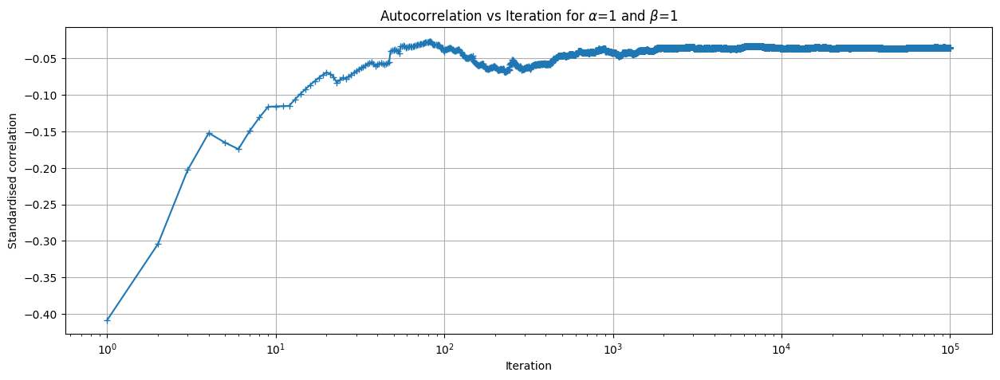

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 0, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 0, 0, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 0, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 0, 1, 1, 1, 0],
       [1, 1, 1, 1, 0, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

In [10]:
Gibbs_P(X0,alpha,beta,n,d,eps,max_iter,plot=1)

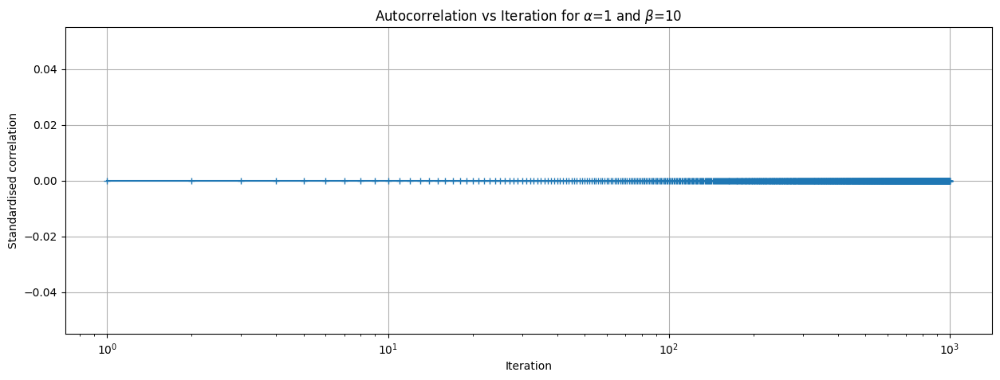

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=uint8)

In [11]:
Gibbs_P(X0,1,10,n,d,eps,max_iter)

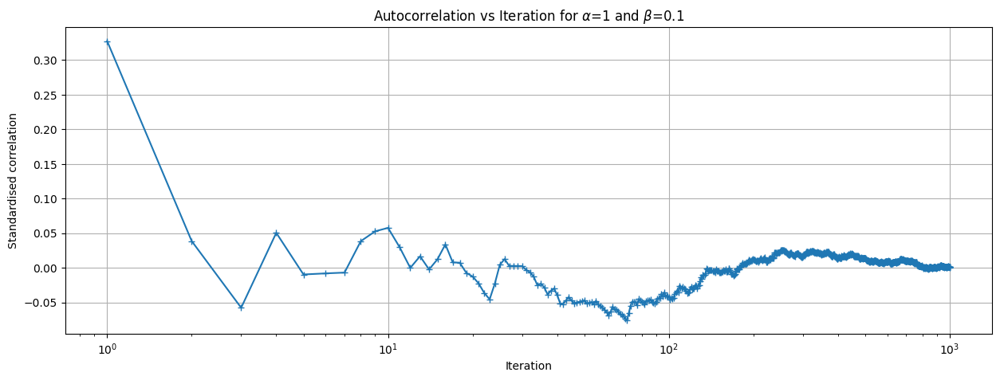

array([[1, 1, 1, 1, 0, 0, 1, 1, 1, 0],
       [0, 1, 1, 1, 1, 1, 1, 0, 1, 1],
       [0, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 0, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 0, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 0, 1],
       [1, 1, 0, 1, 0, 1, 0, 1, 1, 1],
       [1, 1, 1, 1, 1, 0, 0, 1, 1, 1]], dtype=uint8)

In [12]:
Gibbs_P(X0,1,0.1,n,d,eps,max_iter)

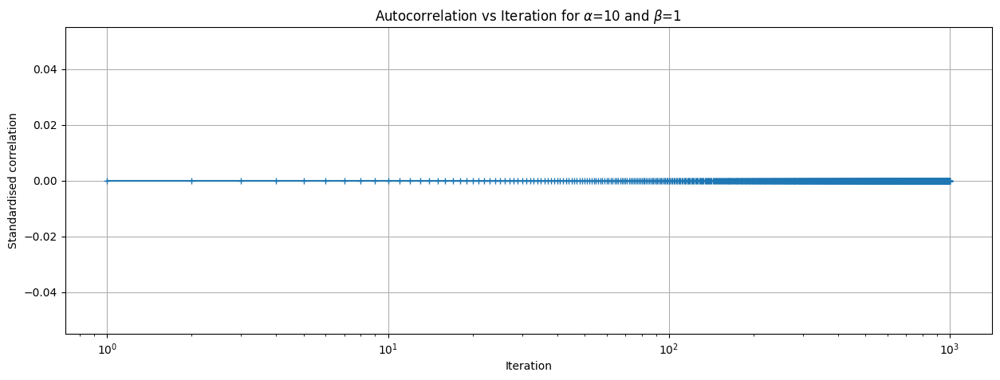

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

In [13]:
Gibbs_P(X0,10,1,n,d,eps,max_iter)

We can intuite some results on this chain, if all the spin are on the same direction, we have that the "energy" needed to change a spin of direction is $2\beta \pm \alpha$. Moreover, for big values of beta compared to alpha, we have that all the time the values drafted will be the binary value that is the most present in the initial vector $X_0$, thus the correlation will be 0 nearly all the time. On the other case, if alpha is very large, we have that all the time the drafted value will be 1. Thus we can interpret $\alpha$ as "the system preference for a direction compared to the other one".


To better understand the differences between R and P and also the influence of , we will look at the convergence to the stationary state of the chain for $\alpha=1$ and for different values of $\beta$

In [14]:
# We create the vector of the wanted value of beta
Beta =  np.linspace(0.1,2,20)
print(Beta)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.  1.1 1.2 1.3 1.4 1.5 1.6 1.7 1.8
 1.9 2. ]


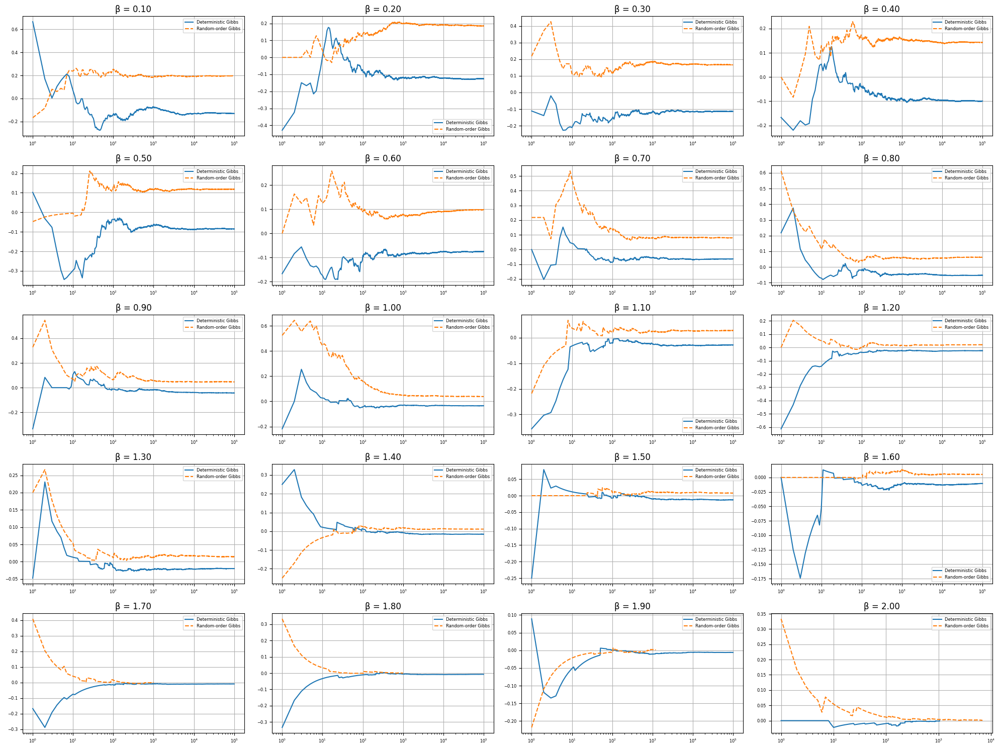

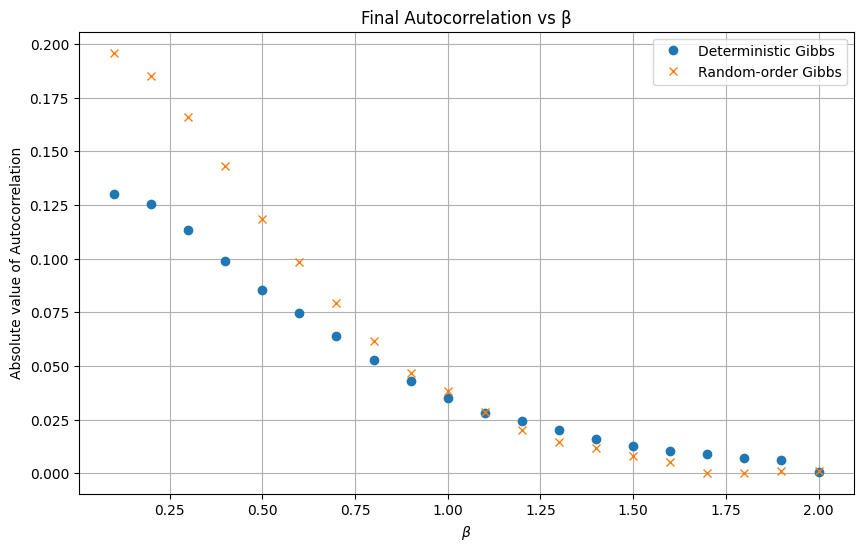

In [15]:
fig = plt.figure(figsize=(20, 15))

final_ac_det = []
final_ac_rand = []
betas_ordered = []

for i in range(5):
    for j in range(4):
        beta = Beta[i + 5 * j]
        betas_ordered.append(beta)

        XP = Gibbs_P(X0, beta, 1, n, d, eps, max_iter, plot=0)
        XR = Gibbs_P(X0, beta, 1, n, d, eps, max_iter, plot=0, R=1)
        L1, AC1 = XP[1], XP[2]
        L2, AC2 = XR[1], XR[2]

        final_ac_det.append(np.abs(AC1[-1]))
        final_ac_rand.append(np.abs(AC2[-1]))

        ax = fig.add_subplot(5, 4, i + 5 * j + 1)
        ax.plot(L1, AC1, label="Deterministic Gibbs")
        ax.plot(L2, AC2, label="Random-order Gibbs", linestyle='--')
        ax.set_title(f"β = {beta:.2f}")
        ax.set_xscale('log')
        ax.tick_params(labelsize=6)
        ax.legend(fontsize=6)
        ax.grid(True)

plt.tight_layout()
plt.show()

# Plot of final AC vs beta
plt.figure(figsize=(10, 6))
plt.plot(betas_ordered, final_ac_det, marker='o',linestyle='None', label="Deterministic Gibbs")
plt.plot(betas_ordered, final_ac_rand, marker='x', linestyle='None', label="Random-order Gibbs")
plt.xlabel(r'$\beta$')
plt.ylabel('Absolute value of Autocorrelation')
plt.title('Final Autocorrelation vs β')
plt.grid(True)
plt.legend()
plt.show()


For all the values of Beta studied here there is a good convergence obtained after some iterations. We can then choose 1000 iterations of burn-in for 10000 value drafted then we can choose 10% of burn-in (as in the literature) to compute the Gibbs Sampler. Moreover, we clearly see that when $\beta>>\beta_c=\frac{1}{2}$ the probability of staying at 0 (because here we choose $X_0=\mathbb{0}_n$) of the coordinates become more and more important due to the increasing importance of $\beta$. 

Concerning the utility of doing a random-order Gibbs-Sampler, as we see in the previous graph the random-order one give worst result in most of the case studied and is better when the deterministic one is also higly decorrelated. There is also a need for an operation in $\mathbf{O}(n)$ to sample a random permutation so for the following study of Ising distribution we will use only the deterministic Gibbs-Sampler.

We can finally show a plot of the Ising distribution for various values of $(\alpha,\beta)$ to show visually the results for the 1D Chain.

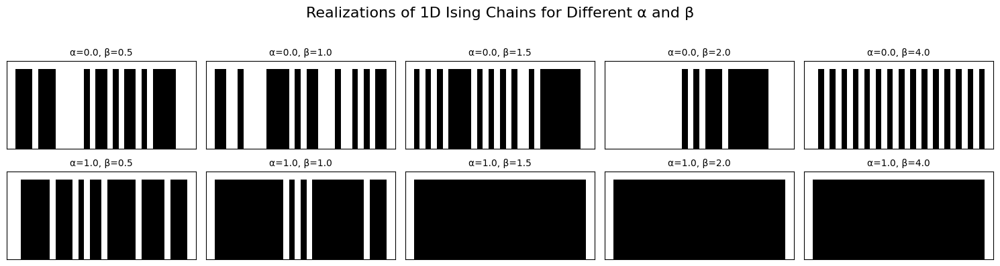

In [16]:
# Parameters
alphas = [0.0, 1.0]
betas = [0.5, 1.0, 1.5,2.,4.]
n = 30
d = 1
eps = 0.01
max_iter = 1000
X0 = np.random.choice([0, 1], size=n)

# Plot setup
fig, axs = plt.subplots(len(alphas), len(betas), figsize=(15, 4), sharex=True, sharey=True)
fig.suptitle("Realizations of 1D Ising Chains for Different α and β", fontsize=16)

for i, alpha in enumerate(alphas):
    for j, beta in enumerate(betas):
        result = Gibbs_P(X0, alpha, beta, n, d, eps, max_iter, plot=0)
        
        # Make sure to always extract the final configuration
        if isinstance(result, tuple):
            X_realizations = result[0]
        else:
            X_realizations = result

        y = X_realizations[-1]  # final chain
        x = np.arange(n)

        ax = axs[i, j]
        ax.bar(x, y, width=1.0, color=['black' if v == 1 else 'lightcoral' for v in y])
        ax.set_ylim(0, 1.1)
        ax.set_title(f"α={alpha}, β={beta}", fontsize=10)
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#### The 2D closed grid

In [17]:
def gibbs_sampler_ising(alpha, beta, N, iterations):
    
    X = rng.choice([0,1], size=(N,N))     # random initialisation of the 2D vector on the grid  N x N

    for it in range(iterations):                # Nombre de fois où on modifie notre grille (atteindre une situation de convergence suffisante)
        for i in range(N):
            for j in range(N):
                voisins = [
                    X[(i-1)%N,j], X[(i+1)%N,j],                  # Sur une grille 2D, chaque cellule a 4 voisins (Hypothèse de 'conditions aux bords périodiques')
                    X[i,(j-1)%N], X[i,(j+1)%N]
                ]
                sum_voisins_1 = sum(voisins)                     # Voisins_1 = nombre de voisins qui prennent la valeur 1
                sum_voisins_0 = 4 - sum_voisins_1                 

                proba_1 = np.exp(alpha + beta*sum_voisins_1)        
                proba_0 = np.exp(beta*sum_voisins_0)
                p = proba_1 / (proba_1 + proba_0)

                # Mise à jour du site (i,j)
                X[i,j] = np.random.rand() < p

    return X


@njit
def gibbs_sampler_ising_periodique_fast(alpha, beta, N, iterations):
    X = np.random.randint(0, 2, size=(N, N))

    for _ in range(iterations):
        for i in range(N):
            for j in range(N):
                n1 = X[(i+1)%N, j] + X[(i-1)%N, j] + X[i, (j+1)%N] + X[i, (j-1)%N]
                n0 = 4 - n1

                p1 = np.exp(alpha + beta * n1)
                p0 = np.exp(beta * n0)
                p = p1 / (p1 + p0)

                X[i, j] = np.random.random() < p

    return X


As we have seen before, there is a pretty good convergence of the correlation for a burn in time of 100 iterations so for the 2D simulations, we will use this threshold for time purpose because the simulations for the 2D grid.

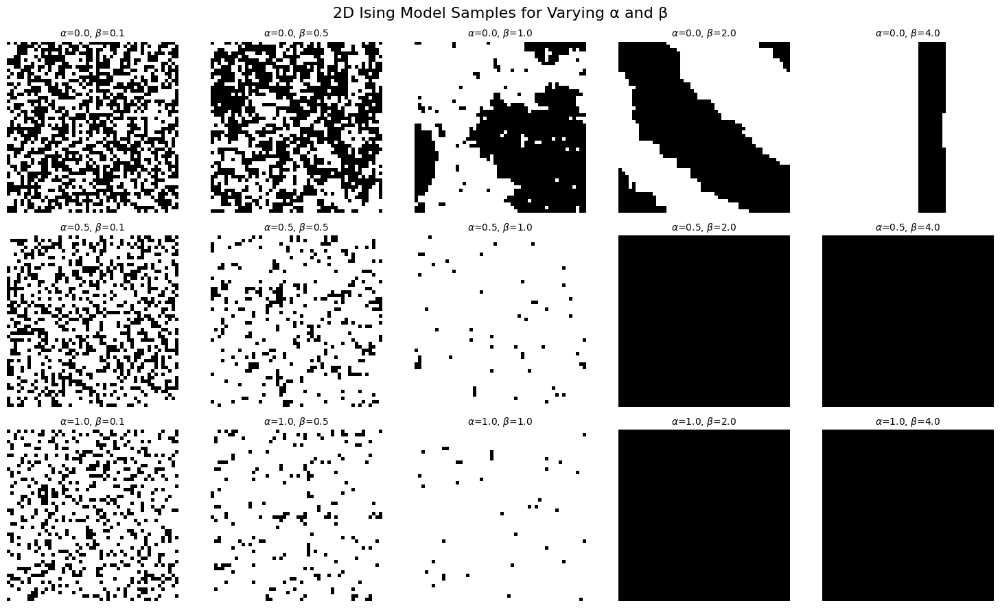

In [18]:
# Define grid of parameters
alphas = [0.0, 0.5, 1.0]
betas = [0.1, 0.5, 1.0, 2.0, 4.0]
N = 50              # Grid size (N x N)
iterations = 1000    # Number of iterations to reach stationarity

fig, axs = plt.subplots(len(alphas), len(betas), figsize=(15, 9))

for i, alpha in enumerate(alphas):
    for j, beta in enumerate(betas):
        final_state = gibbs_sampler_ising_periodique_fast(alpha, beta, N, iterations)
        ax = axs[i, j]
        ax.imshow(final_state, cmap='gray')
        ax.set_title(rf"$\alpha$={alpha}, $\beta$={beta}", fontsize=10)
        ax.axis('off')

plt.suptitle("2D Ising Model Samples for Varying α and β", fontsize=16)
plt.tight_layout()
plt.show()


The 2D grid is better to understand visually the impact of $\alpha$ and $beta$ on the Ising distribution, but we find the same results than with the 1D chain, for $\alpha=0$, the transition between the 2 phases is smooth because the system has no preference for one direction compared to the other one, but for $\alpha>0$ the system has a preference for spins up leading to more brutal phase transition at $\beta=0.5$

## Question 2

We have the expression of $Z(\alpha,\beta)$: $$Z(\alpha,\beta)=\sum_{x_1=0}^1...\sum_{x_n=0}^1exp\left(\alpha\sum_{i=1}^n x_i + \beta \sum_{j : j \sim i} \mathbb{1} (x_i=x_j)\right) $$

To compute the MLE we have to know exactly the form of the likelihood, we have the full expression here so this is not an issue but we also have to be able to compute easily this expression, which is not the case here because the number of terms in Z increase exponentially.

To tackle this issue, we will use an ABC-rejection algorithm to find the corrects value of $\alpha$ and $\beta$.

We will continue to use $\alpha = 1$ for the same reason as before, not less for simplicity but not more because in this case there is to much 1 that will be drafted. Concerning $\beta$, we will use $\beta=0.9$ to see the good work of the algorithm.  
Moreover we will continue using the neighborhood relation of the question 1 for simplicity and the deterministic Gibbs Sampler to compute the Gibbs distribution after the burning period. 

For the ABC-rejection, we need to sample $\alpha$ and $\beta$ from a prior distribution $\pi$, because we assume for the similarity with real experiment, that we just know that $(\alpha^*,\beta^*)\in Supp(\pi)$ (the real values are in the support of $\pi$). Thus for simplicity and application to real world, we choose $\pi_{\alpha} \sim \mathcal{U}([a,b])$ and $\pi_{\beta} \sim \mathcal{U}([a',b'])$. 

Then, we sample from the real Gibbs distribution and we obtain $y^*$. After, of we choose an $\varepsilon$ such that we accept the value of $(\alpha,\beta)$ if $$\lVert S(y) - S(y^*)\rVert < \varepsilon$$ with a $\lVert.\rVert$ a norm and S the sufficient statistics S(x)=$\left(\sum_{i=1}^n x_i\;,\;\sum_{i=1}^n\sum_{j:j\sim i}\mathbb{1}(x_i=x_j)\right)$

### a)  The 1D Closed Chain 

To talk about more concrete things about the algorithm, first we will sample of size d=10 for ($\alpha,\beta$)=(1,0.9) after a very long burning time so that there is the less correlation possible, allowing the inference to be the best possible after.

In [19]:
# So first we have to draw the sample of "real" values, we  choose a large sample of d=10000 so that we can do better inference

d           = 10000
max_iter    = 1000000


ystar = Gibbs_P(X0,0.9,1,n,d,eps,max_iter,plot=0)[0]

print(ystar)

[[0 1 1 ... 0 1 1]
 [1 1 1 ... 1 0 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]


In [20]:
# After, we have to create a function that sample from the distribution of Pi and return the sample drafted for these values

def ABC_1step( d, n, eps2, max_iter2):
    U1 = 5.9*rng.random()+0.1
    U2 = 5.9*rng.random()+0.1
    return Gibbs_P(X0,U1,U2,n,d,eps2,max_iter2,plot=0)[0],U1,U2

def S(x):
    s1, s2 = 0, 0
    n = len(x)
    for i in range(n):
        s1 += x[i]
        if i == 0:
            neighbors = [x[-1], x[1]]
        elif i == n - 1:
            neighbors = [x[n - 2], x[0]]
        else:
            neighbors = [x[i - 1], x[i + 1]]
        for e in neighbors:
            if e == x[i]: 
                s2 += 1
    return np.array([s1, s2])



def norm_ABC(y, ystar):
    k = len(y)
    diff = np.zeros(2)
    for i in range(k):
        diff += S(y[i]) - S(ystar[i])
    return np.sqrt(np.sum(diff**2)) / (k*n)






In [21]:
# In the end we have to create the global algorithm

def ABC(n, d, l, eps2, max_iter2, ystar):
    theta = []
    #for _ in tqdm(range(l), desc="ABC sampling", leave=False):
    for _ in range(l):
        y, alpha, beta = ABC_1step(d, n, eps2, max_iter2)
        distance = norm_ABC(y, ystar)
        if distance <= eps2:
            theta.append([alpha, beta])
    return np.array(theta)


In [22]:
# Main experiment runner
def run_experiment(eps_list, n, d, l, max_iter, ystar, true_alpha, true_beta):
    results = []
    
    for eps in eps_list:
        samples = ABC(n, d, l, eps, max_iter, ystar)
        acceptance_rate = len(samples) / l

        # Compute the mean (alpha, beta) for the accepted samples
        if len(samples) > 0:
            samples = np.array(samples)
            alpha_mean = samples[:, 0].mean()
            beta_mean = samples[:, 1].mean()

            # Calculate the Euclidean distance to the true values
            distance = euclidean((alpha_mean, beta_mean), (true_alpha, true_beta))
        else:
            alpha_mean = beta_mean = distance = np.nan
        
        results.append({
            "epsilon": eps,
            "accepted": samples,
            "acceptance_rate": acceptance_rate,
            "true_alpha": true_alpha,
            "true_beta": true_beta,
            "distance_to_true": distance,
            "alpha_mean": alpha_mean,
            "beta_mean": beta_mean
        })
    
    return results

# Visualization function
def plot_results(results):
    # Plot acceptance rate vs epsilon
    eps_vals = [r["epsilon"] for r in results]
    acc_rates = [r["acceptance_rate"] for r in results]
    distance_to_true = [r["distance_to_true"] for r in results]

    plt.figure(figsize=(10, 4))
    plt.plot(eps_vals, acc_rates, marker='o', color='darkorange')
    plt.xlabel("ε (epsilon)")
    plt.ylabel("Acceptance Rate")
    plt.title("Acceptance Rate vs Epsilon")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot distance to true values vs epsilon
    plt.figure(figsize=(10, 4))
    plt.plot(eps_vals, distance_to_true, marker='o', color='darkblue')
    plt.xlabel("ε (epsilon)")
    plt.ylabel("Distance to True (α, β)")
    plt.title("Distance to True (α, β) vs Epsilon")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Distribution plots
    for r in results:
        samples = r["accepted"]
        eps = r["epsilon"]
        true_alpha = r["true_alpha"]
        true_beta = r["true_beta"]
        
        if len(samples) == 0:
            print(f"No samples accepted for ε = {eps}")
            continue

        samples = np.array(samples)
        df = pd.DataFrame(samples, columns=["alpha", "beta"])

        alpha_mean = df["alpha"].mean()
        beta_mean = df["beta"].mean()
        alpha_std = df["alpha"].std()
        beta_std = df["beta"].std()

        # Printing true and computed alpha/beta
        print(f"True alpha: {true_alpha}, True beta: {true_beta}")
        print(f"Mean alpha: {alpha_mean}, Std alpha: {alpha_std}")
        print(f"Mean beta: {beta_mean}, Std beta: {beta_std}")
        
        plt.figure(figsize=(6, 5))
        ax = plt.gca()

        try:
            # KDE plot
            kde = sns.kdeplot(
                data=df, x="alpha", y="beta", 
                fill=True, cmap="mako", thresh=0.05, ax=ax
            )

            # Try to get colorbar
            if kde.collections:
                mappable = kde.collections[0]
                plt.colorbar(mappable, ax=ax, label="Density")

        except Exception as e:
            print(f"Skipping colorbar for ε = {eps} due to error: {e}")

        # Plot mean point with error bars
        plt.errorbar(alpha_mean, beta_mean, 
                     xerr=alpha_std, yerr=beta_std, 
                     fmt='o', color='red', ecolor='black', elinewidth=1.5, capsize=4,
                     label='Mean ± Std')

        # Plot the true values
        plt.scatter(true_alpha, true_beta, color='blue', label='True values', s=100, edgecolor='black', marker='X')

        # Final touches
        plt.title(f"Distribution of Accepted (α, β) for ε = {eps}\n(n={len(samples)})")
        plt.xlabel("alpha")
        plt.ylabel("beta")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()



In [23]:
n = 10
X0 = rng.integers(0, 2, size=n)  #generate a binary vector of size n

ystar = Gibbs_P(X0, 1.0, 0.9, n=n, d=50, eps=0.01, max_iter=10000, plot=0)[0]


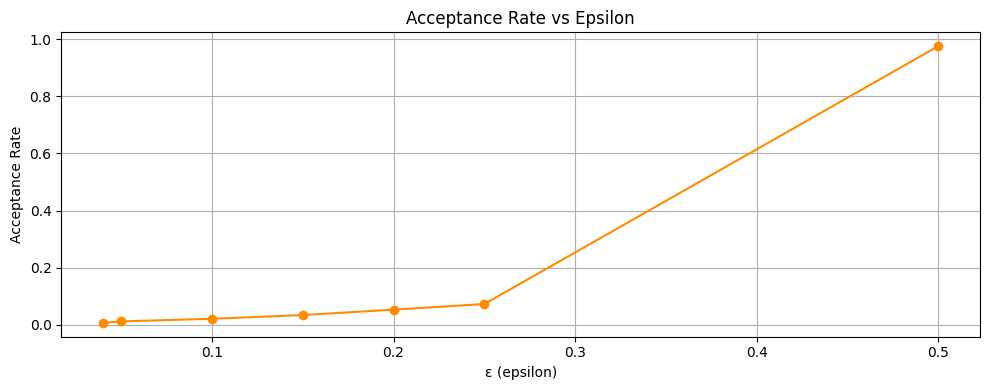

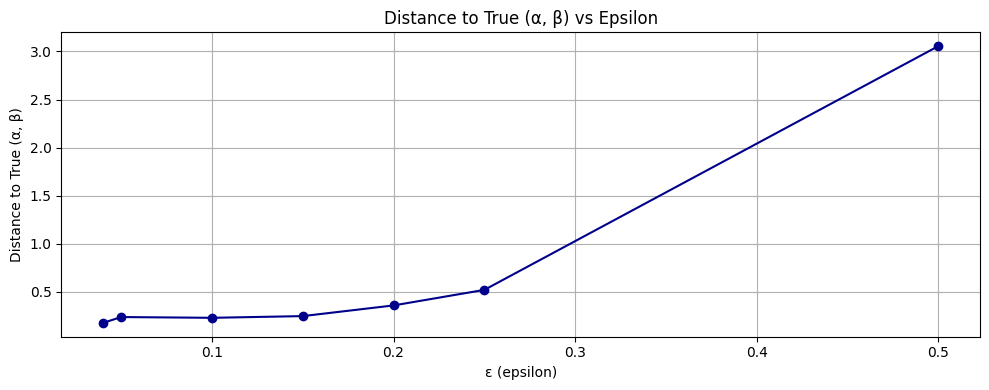

True alpha: 1, True beta: 0.9
Mean alpha: 1.1127166032939142, Std alpha: 0.5662747393098194
Mean beta: 1.0389910274324028, Std beta: 0.6968058634411111


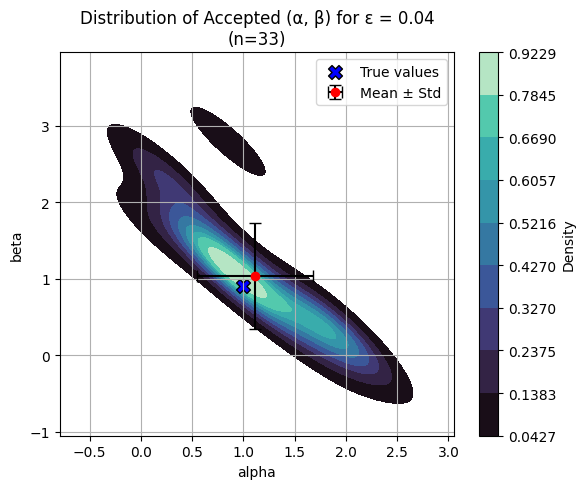

True alpha: 1, True beta: 0.9
Mean alpha: 1.2391999937460805, Std alpha: 0.5993976704435744
Mean beta: 0.9137724764886581, Std beta: 0.6343590688615743


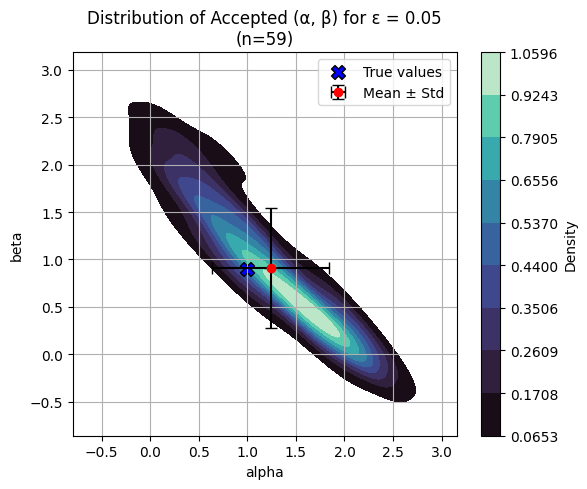

True alpha: 1, True beta: 0.9
Mean alpha: 1.2078097199444409, Std alpha: 0.6244319612951987
Mean beta: 1.002517316682433, Std beta: 0.7600566722621006


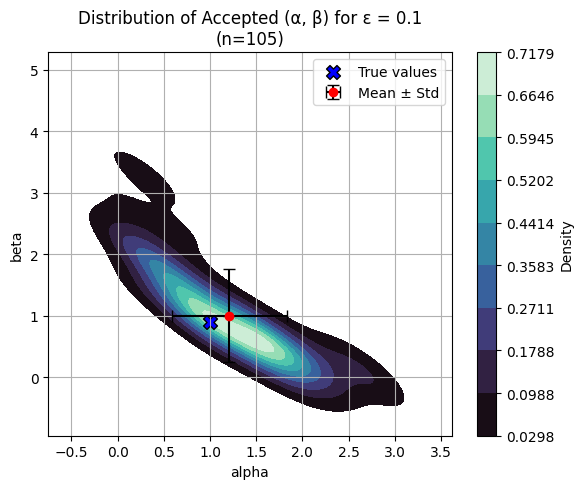

True alpha: 1, True beta: 0.9
Mean alpha: 1.2279123875562237, Std alpha: 0.6304245252223759
Mean beta: 1.0013109088410086, Std beta: 0.7238988669756269


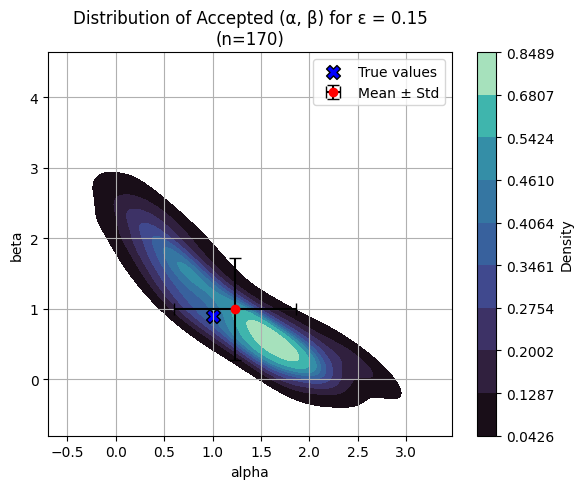

True alpha: 1, True beta: 0.9
Mean alpha: 1.347325316075038, Std alpha: 0.6876553828125096
Mean beta: 0.9963321719513878, Std beta: 0.7153137880566949


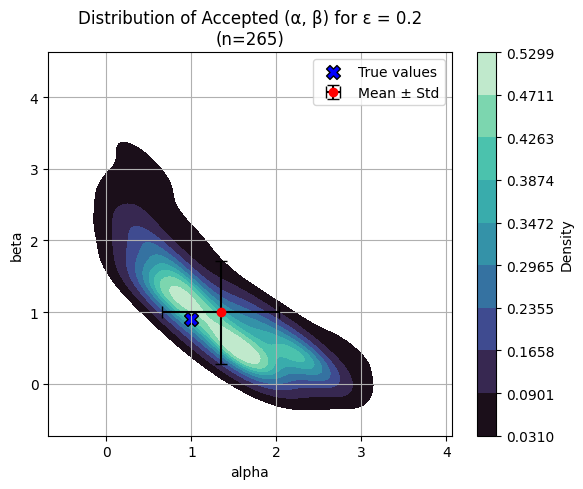

True alpha: 1, True beta: 0.9
Mean alpha: 1.5181677671896385, Std alpha: 0.7925199283412396
Mean beta: 0.9623366409847136, Std beta: 0.720658318059973


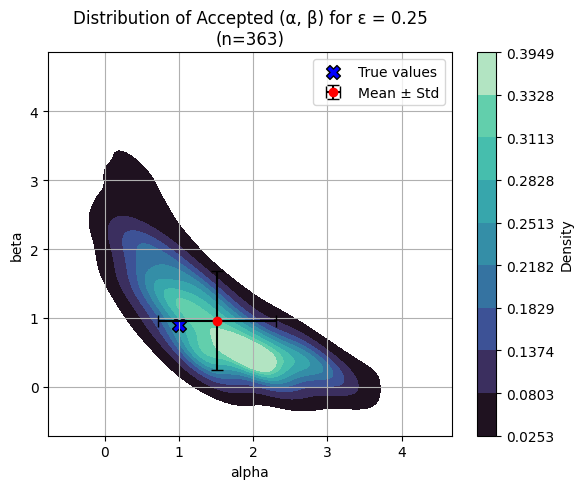

True alpha: 1, True beta: 0.9
Mean alpha: 3.104172632355011, Std alpha: 1.6752552173178399
Mean beta: 3.115128266831947, Std beta: 1.701516985166593


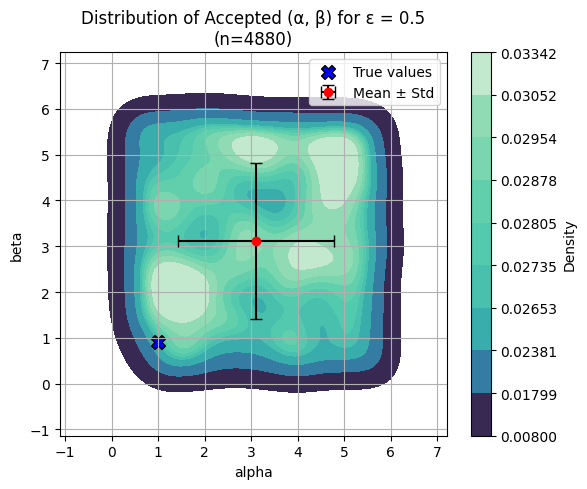

In [24]:
# Define epsilon values
eps_values = [0.04,0.05,0.1, 0.15, 0.2, 0.25,0.5]

# Run experiment
results = run_experiment(eps_values, n=n, d=50, l=5000, max_iter=100, ystar=ystar,true_alpha=1,true_beta=0.9)

# Plot results
plot_results(results)


As some empirical studies shows, a good acceptance rate is around 1% so we will take $\varepsilon = 0.05$. Moreover the norm function used in ABC depends of the size n of the vector thus this value of $\varepsilon$ should be universal for all the n.

We can now check the effect of n on these distribution.

For some mysterious reason the plot for different values of n kill the python kernell thus we will only illustrate this feature of our ABC function for an hypothetical distribution.

Running experiment for n = 10
Running experiment for n = 20
Running experiment for n = 50
Running experiment for n = 100
Running experiment for n = 200


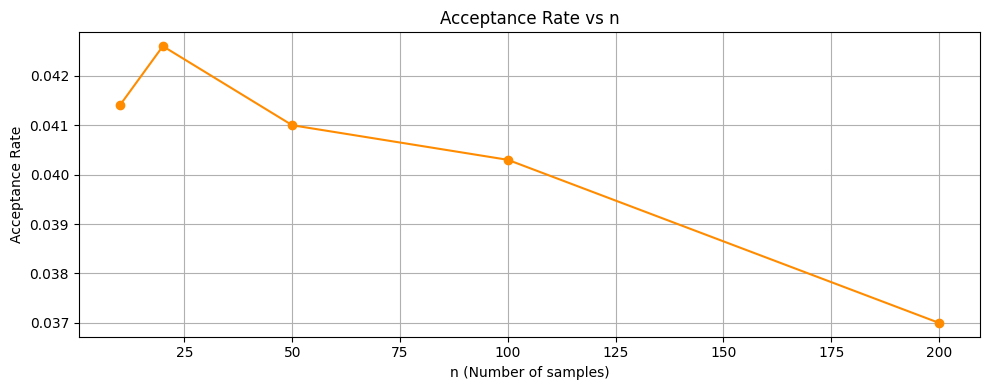

True alpha: 1.0, True beta: 0.8
Mean alpha: 0.9895135772200522, Std alpha: 0.19540318052912065
Mean beta: 0.7880325850868907, Std beta: 0.20307988242991296


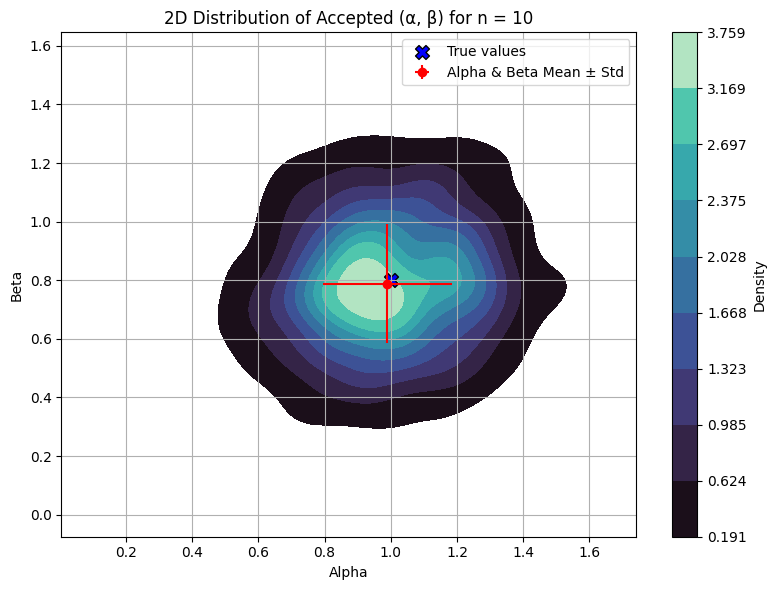

True alpha: 1.0, True beta: 0.8
Mean alpha: 1.0014278434373782, Std alpha: 0.2105908434272281
Mean beta: 0.8005741816575346, Std beta: 0.1982278684156516


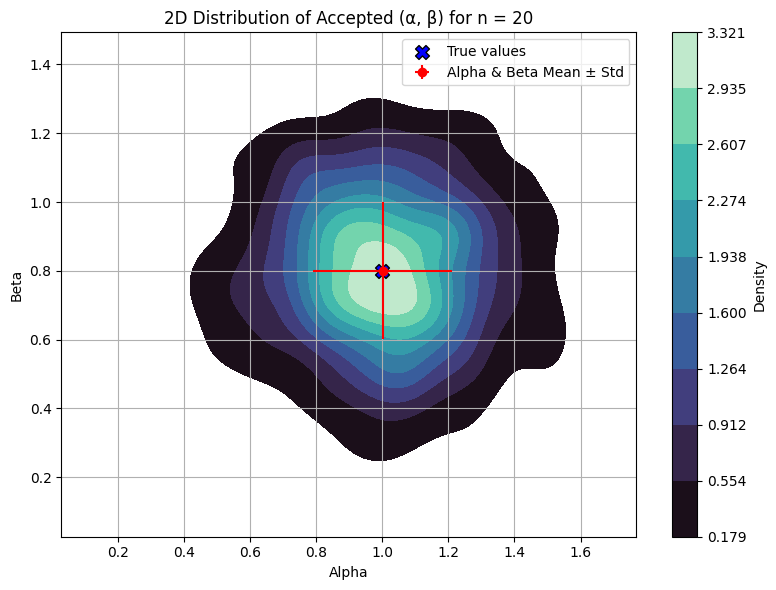

True alpha: 1.0, True beta: 0.8
Mean alpha: 1.0082732493286497, Std alpha: 0.20716724244480822
Mean beta: 0.8054253436169713, Std beta: 0.20069574360926132


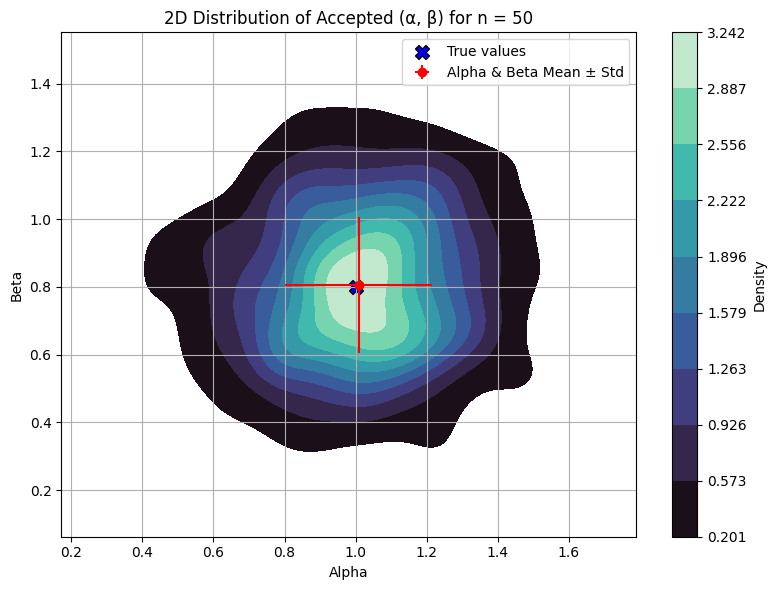

True alpha: 1.0, True beta: 0.8
Mean alpha: 0.9960590425533582, Std alpha: 0.19850873211449696
Mean beta: 0.8101866574432006, Std beta: 0.198873588883229


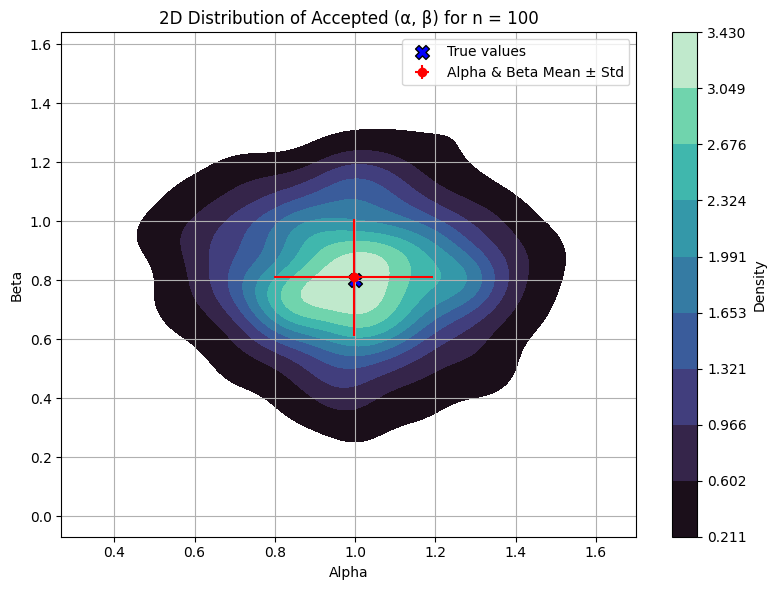

True alpha: 1.0, True beta: 0.8
Mean alpha: 1.0102366532366447, Std alpha: 0.22453828381121752
Mean beta: 0.7993854403303788, Std beta: 0.2016576166119708


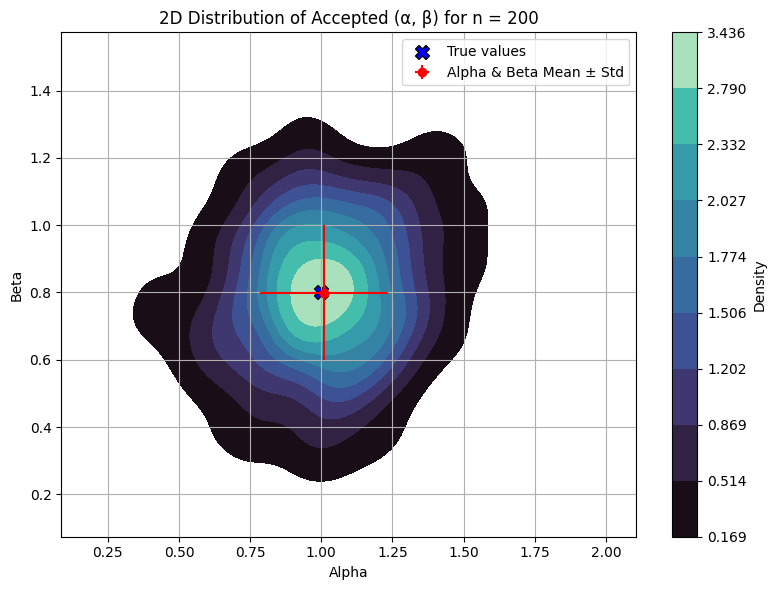

In [75]:
# Simplified ABC sampling function
def ABC(n, d, l, eps, max_iter, ystar):
    # Dummy function to simulate ABC sampling
    # We generate random alpha and beta values for simplicity
    alpha = rng.normal(1.0, 0.2, size=l)  # Simulate alpha samples
    beta = rng.normal(0.8, 0.2, size=l)   # Simulate beta samples
    
    # Calculate acceptance rate based on the number of samples accepted
    accepted = np.random.rand(l) < eps  # Simulate whether each sample is accepted
    
    return np.column_stack([alpha[accepted], beta[accepted]])

# Main experiment loop to vary n
def run_experiment_with_n(n_list, d, l, eps, max_iter, true_alpha, true_beta):
    results = []
    
    for n in n_list:
        print(f"Running experiment for n = {n}")
        
        # Dummy target data ystar
        ystar = np.random.rand(d)
        
        # Run the ABC sampling for this n
        samples = ABC(n, d, l, eps, max_iter, ystar)
        
        # Acceptance rate (fraction of accepted samples)
        acceptance_rate = len(samples) / l
        results.append({
            "n": n,
            "accepted": samples,
            "acceptance_rate": acceptance_rate,
            "true_alpha": true_alpha,
            "true_beta": true_beta
        })
    
    return results

# Visualization function for results
def plot_results_by_n(results):
    # Plot Acceptance Rate vs n
    n_vals = [r["n"] for r in results]
    acc_rates = [r["acceptance_rate"] for r in results]

    plt.figure(figsize=(10, 4))
    plt.plot(n_vals, acc_rates, marker='o', color='darkorange')
    plt.xlabel("n (Number of samples)")
    plt.ylabel("Acceptance Rate")
    plt.title("Acceptance Rate vs n")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Distribution plots for each n (2D KDE with colorbar)
    for r in results:
        samples = r["accepted"]
        n = r["n"]
        true_alpha = r["true_alpha"]
        true_beta = r["true_beta"]
        
        if len(samples) == 0:
            print(f"No samples accepted for n = {n}")
            continue

        # Convert samples into a dataframe for easy plotting
        samples = np.array(samples)
        alpha_samples = samples[:, 0]
        beta_samples = samples[:, 1]

        # Printing true and computed alpha/beta
        alpha_mean = np.mean(alpha_samples)
        beta_mean = np.mean(beta_samples)
        alpha_std = np.std(alpha_samples)
        beta_std = np.std(beta_samples)

        print(f"True alpha: {true_alpha}, True beta: {true_beta}")
        print(f"Mean alpha: {alpha_mean}, Std alpha: {alpha_std}")
        print(f"Mean beta: {beta_mean}, Std beta: {beta_std}")
        
        # Plot 2D KDE of accepted samples
        plt.figure(figsize=(8, 6))
        kde = sns.kdeplot(x=alpha_samples, y=beta_samples, fill=True, cmap="mako", thresh=0.05)
        
        # Adding colorbar using the mappable object
        # mappable must be from the density plot (using the 'kde' returned object)
        mappable = kde.collections[0]  # This is the mappable from the kdeplot
        plt.colorbar(mappable, label="Density")
        
        # Plot mean points with error bars
        plt.errorbar(alpha_mean, beta_mean, xerr=alpha_std, yerr=beta_std, fmt='o', color='red', label=f"Alpha & Beta Mean ± Std")
        
        # Plot the true values
        plt.scatter(true_alpha, true_beta, color='blue', label='True values', s=100, edgecolor='black', marker='X')
        
        # Add titles and labels
        plt.title(f"2D Distribution of Accepted (α, β) for n = {n}")
        plt.xlabel("Alpha")
        plt.ylabel("Beta")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Parameters
n_list = [10, 20, 50, 100, 200]  # Varying n
d = 50  # Dimensionality
l = 10000  # Number of samples
eps = 0.04  # Epsilon for acceptance threshold
max_iter = 100  # Max iterations (not used in this simple example)
true_alpha = 1.0
true_beta = 0.8

# Run the experiment and plot the results
results = run_experiment_with_n(n_list, d, l, eps, max_iter, true_alpha, true_beta)
plot_results_by_n(results)


The results obtained don't depend on the size n of the closed chain and because of the form of our norm we can use the same value of epsilon for the different chain size!

##### Conclusion

The results obtained with ABC for the Ising distribution are very good, if we estimate $(\alpha,\beta)$ with the mean with respect to the posterior distribution, we have a very good estimation of these parameters!

### b) The 2D closed grid

We will know see if this work better with the 2D grid.

In [76]:
def sufficient_statistic(X):
    sum_x = X.sum()
    voisins_egaux = np.sum(X[:, :-1]==X[:, 1:]) + np.sum(X[:-1, :]==X[1:, :])
    return np.array([sum_x, voisins_egaux])

In [77]:
# Simuler UNE SEULE FOIS les données observées avec les vrais paramètres vrais
alpha_true = 0.5
beta_true = 1.0
N = 20
iterations_simulation = 50
X_obs = gibbs_sampler_ising_periodique_fast(alpha_true, beta_true, N, iterations_simulation)

In [78]:
def ABC_reject_final(X_obs, alpha_prior, beta_prior, N, epsilon, n_iter, gibbs_iter):
    accepted_params = []
    S_obs = sufficient_statistic(X_obs)

    for _ in range(n_iter):
        # Tirage selon la loi a priori (obligatoire avant chaque grille)
        alpha_star = np.random.uniform(*alpha_prior)
        beta_star = np.random.uniform(*beta_prior)

        # Simulation d'une grille selon les nouveaux paramètres candidats
        X_sim = gibbs_sampler_ising_periodique_fast(alpha_star, beta_star, N, gibbs_iter)

        # Calcul de la distance
        S_sim = sufficient_statistic(X_sim)
        distance = (1/(N^2))*np.linalg.norm(S_sim - S_obs)

        # Acceptation ou rejet
        if distance <= epsilon:
            accepted_params.append((alpha_star, beta_star))


    return np.array(accepted_params)

In [79]:
# Paramètres de base
alpha_prior = (-1, 2)
beta_prior = (0, 2)
epsilon = 0.1
n_iter = 10000
gibbs_iter = 50
N = X_obs.shape[0]  # ou taille manuelle de la grille

accepted_params = ABC_reject_final(X_obs, alpha_prior, beta_prior, N, epsilon, n_iter, gibbs_iter)
accepted_params = np.array(accepted_params)

print(f"{len(accepted_params)} paramètres acceptés sur {n_iter} ({len(accepted_params)/n_iter:.2%})")

71 paramètres acceptés sur 10000 (0.71%)


After looking for the right epsilon to obtain 1% of acceptance rate, we can choose approximatly $\epsilon=0.1$

In [80]:
def run_abc_for_various_n(alpha_prior, beta_prior, n_values, epsilon, n_iter, gibbs_iter):
    results = []
    true_alpha = 0.8
    true_beta = 1.2

    for n in n_values:
        X_obs = gibbs_sampler_ising_periodique_fast(true_alpha, true_beta, n, gibbs_iter)
        accepted = ABC_reject_final(X_obs, alpha_prior, beta_prior, n, epsilon, n_iter, gibbs_iter)
        
        acceptance_rate = len(accepted) / n_iter
        results.append({
            "n": n,
            "accepted": accepted,
            "acceptance_rate": acceptance_rate,
            "true_alpha": true_alpha,
            "true_beta": true_beta
        })

    return results


def plot_results_by_n(results):
    # Plot Acceptance Rate vs n
    n_vals = [r["n"] for r in results]
    acc_rates = [r["acceptance_rate"] for r in results]

    plt.figure(figsize=(10, 4))
    plt.plot(n_vals, acc_rates, marker='o', color='darkorange', linestyle='-', markersize=8, label="Acceptance Rate")
    plt.xlabel("n (Number of samples)", fontsize=12)
    plt.ylabel("Acceptance Rate", fontsize=12)
    plt.title("Acceptance Rate vs n", fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # Distribution plots for each n (2D KDE with colorbar)
    for r in results:
        samples = r["accepted"]
        n = r["n"]
        true_alpha = r["true_alpha"]
        true_beta = r["true_beta"]
        
        if len(samples) == 0:
            print(f"No samples accepted for n = {n}")
            continue

        # Convert samples into a numpy array for easy plotting
        samples = np.array(samples)
        alpha_samples = samples[:, 0]
        beta_samples = samples[:, 1]

        # Printing true and computed alpha/beta values
        alpha_mean = np.mean(alpha_samples)
        beta_mean = np.mean(beta_samples)
        alpha_std = np.std(alpha_samples)
        beta_std = np.std(beta_samples)

        print(f"True alpha: {true_alpha}, True beta: {true_beta}")
        print(f"Mean alpha: {alpha_mean:.3f}, Std alpha: {alpha_std:.3f}")
        print(f"Mean beta: {beta_mean:.3f}, Std beta: {beta_std:.3f}")
        
        # Plot 2D KDE of accepted samples
        plt.figure(figsize=(8, 6))
        kde = sns.kdeplot(x=alpha_samples, y=beta_samples, fill=True, cmap="cividis", thresh=0.05)

        # Adding colorbar using the mappable object from the KDE plot
        mappable = kde.collections[0]
        cbar = plt.colorbar(mappable)
        cbar.set_label("Density", fontsize=12)

        # Plot mean points with error bars
        plt.errorbar(alpha_mean, beta_mean, xerr=alpha_std, yerr=beta_std, fmt='o', color='red', 
                     label=f"Mean ± Std (α={alpha_mean:.3f}, β={beta_mean:.3f})", 
                     capsize=5, markersize=8)

        # Plot the true values
        plt.scatter(true_alpha, true_beta, color='blue', label='True values', s=100, edgecolor='black', marker='X')

        # Title and labels
        plt.title(f"2D Distribution of Accepted (α, β) for n = {n}", fontsize=14)
        plt.xlabel("Alpha", fontsize=12)
        plt.ylabel("Beta", fontsize=12)
        plt.legend(fontsize=10, loc='upper left')

        # Grid and layout
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()



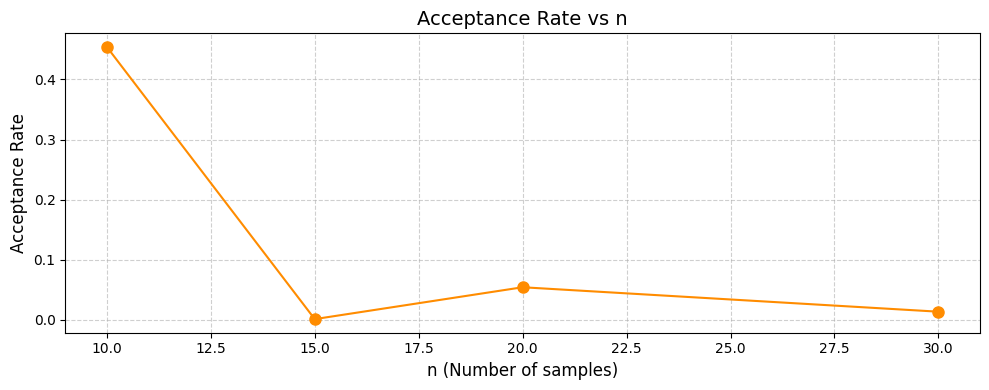

True alpha: 0.8, True beta: 1.2
Mean alpha: 1.109, Std alpha: 0.556
Mean beta: 1.482, Std beta: 0.345


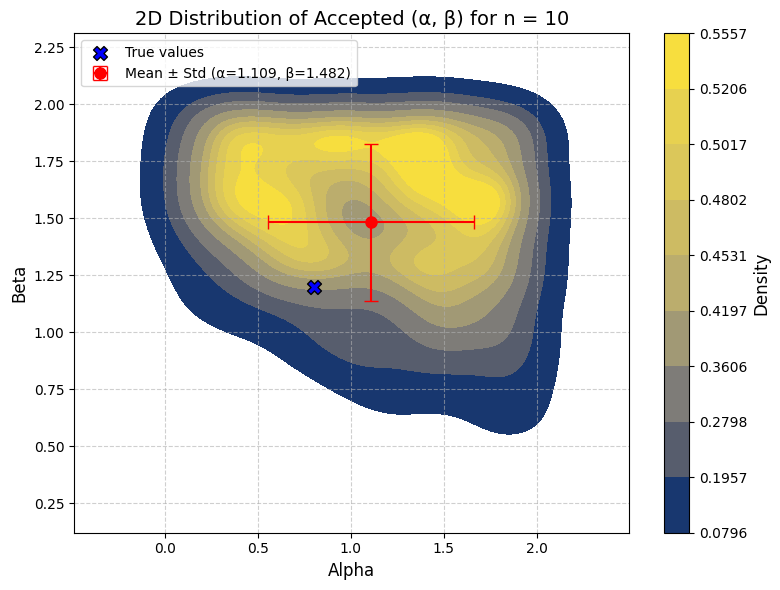

True alpha: 0.8, True beta: 1.2
Mean alpha: 1.071, Std alpha: 0.683
Mean beta: 0.978, Std beta: 0.305


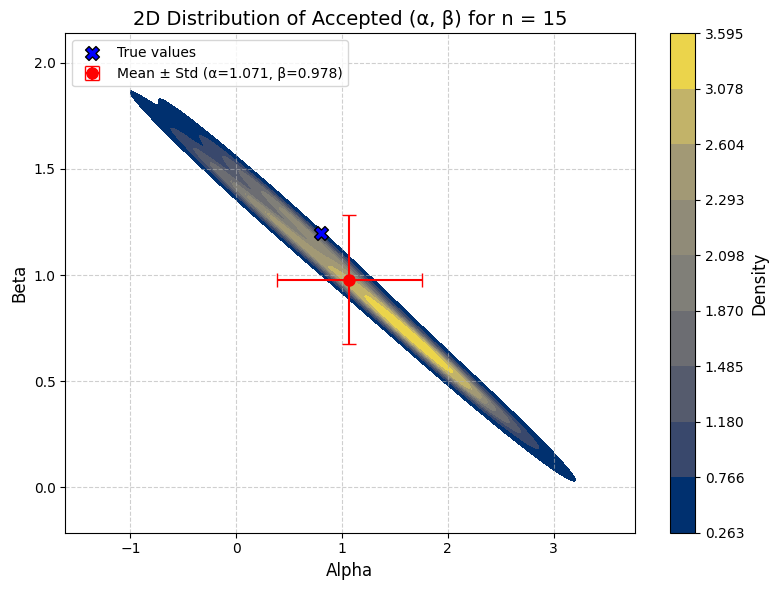

True alpha: 0.8, True beta: 1.2
Mean alpha: 1.023, Std alpha: 0.579
Mean beta: 1.175, Std beta: 0.269


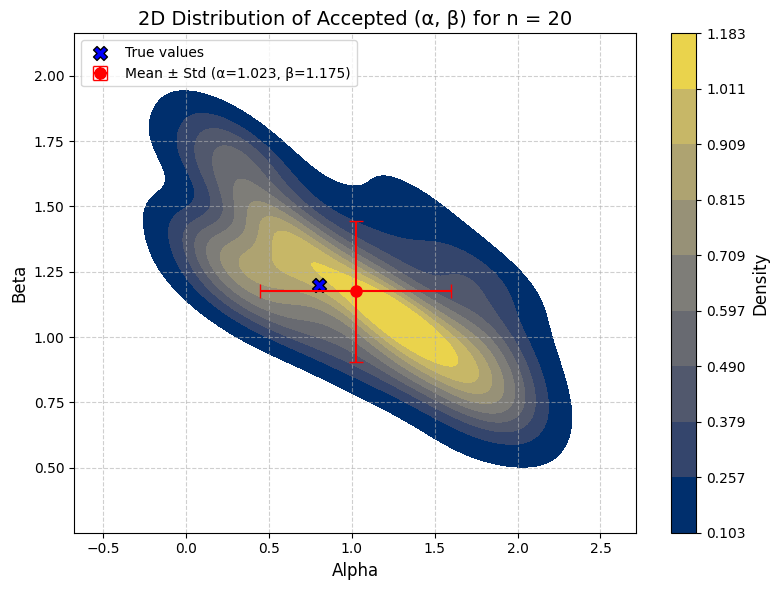

True alpha: 0.8, True beta: 1.2
Mean alpha: 1.105, Std alpha: 0.624
Mean beta: 1.065, Std beta: 0.174


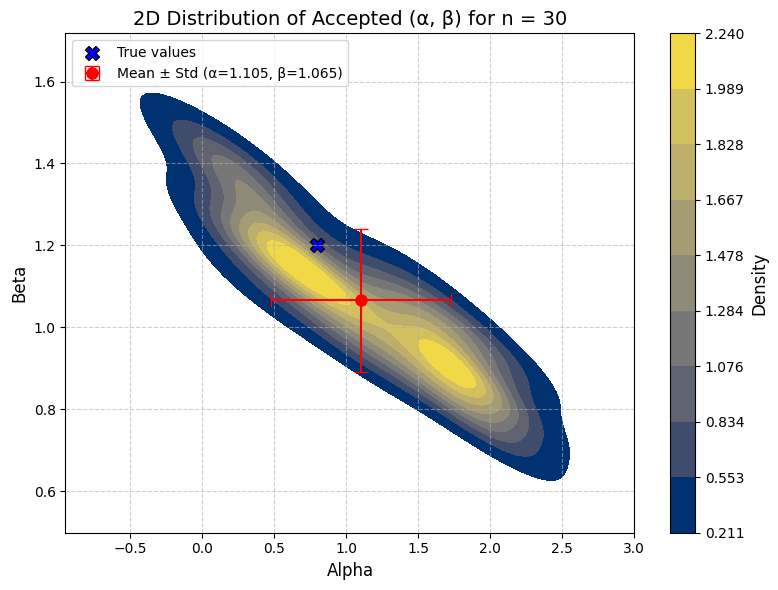

In [81]:
# Example grid
N_obs = 10
true_alpha, true_beta = 1.0, 0.8

# Parameters
alpha_prior = (0, 2)
beta_prior = (0, 2)
epsilon = 0.05
n_iter = 3000
gibbs_iter = 500
n_values = [10, 15, 20, 30]

# Run and plot
results = run_abc_for_various_n(alpha_prior, beta_prior, n_values, epsilon, n_iter, gibbs_iter)
plot_results_by_n(results)


We can see that the results of the ABC algorithm are not as good with the 2D grid than with the 1D chain (and also very slow, this is why we limit ourselves to only a size of 30x30), this is why there is a need for other algorithm such as MCMC-ABC (or other algorithm studied in the appendix)

### c) Importance of the prior distribution

We choose an uniform distribution for the prior distribution of $\alpha$ and $\beta$ because we don't have any information on the true value but if we have an idea, is it worth to choose an another distribution such as a Gaussian to estimate the value ?

In [82]:
# True Value
alpha_true = 0.5
beta_true = 1.0

# Normal truncated
def make_truncnorm_sampler(center, sigma, bounds):
    a, b = (bounds[0] - center) / sigma, (bounds[1] - center) / sigma
    return lambda: truncnorm.rvs(a, b, loc=center, scale=sigma)

# Differents priors
informative_priors = [
    {
        "name": "Center in tre true value",
        "alpha": make_truncnorm_sampler(center=alpha_true, sigma=0.3, bounds=(-1, 2)),
        "beta": make_truncnorm_sampler(center=beta_true, sigma=0.3, bounds=(0, 2))
    },
    {
        "name": "Under the true value",
        "alpha": make_truncnorm_sampler(center=alpha_true - 0.4, sigma=0.3, bounds=(-1, 2)),
        "beta": make_truncnorm_sampler(center=beta_true - 0.4, sigma=0.3, bounds=(0, 2))
    },
    {
        "name": "over the true value",
        "alpha": make_truncnorm_sampler(center=alpha_true + 0.4, sigma=0.3, bounds=(-1, 2)),
        "beta": make_truncnorm_sampler(center=beta_true + 0.4, sigma=0.3, bounds=(0, 2))
    }
]

In [83]:
# ABC-Rejection classique avec prior flexible
def ABC_reject_custom_prior(X_obs, alpha_sampler, beta_sampler, N, epsilon, n_iter, gibbs_iter):
    accepted_params = []
    S_obs = sufficient_statistic(X_obs)

    for _ in range(n_iter):
        alpha_star = alpha_sampler()
        beta_star = beta_sampler()
        X_sim = gibbs_sampler_ising_periodique_fast(alpha_star, beta_star, N, gibbs_iter)
        S_sim = sufficient_statistic(X_sim)
        distance = np.linalg.norm(S_sim - S_obs)

        if distance <= epsilon:
            accepted_params.append((alpha_star, beta_star))

    return np.array(accepted_params)

# Paramètres ABC
epsilon = 15
n_iter = 10000
gibbs_iter = 50
N = X_obs.shape[0]

# Résultats
robustness_results = []

for prior in informative_priors:
    print(f"\nPrior : {prior['name']}")
    accepted = ABC_reject_custom_prior(
        X_obs,
        alpha_sampler=prior["alpha"],
        beta_sampler=prior["beta"],
        N=N,
        epsilon=epsilon,
        n_iter=n_iter,
        gibbs_iter=gibbs_iter
    )
    rate = len(accepted) / n_iter
    print(f"{len(accepted)} acceptés ({rate:.2%})")
    robustness_results.append({
        "name": prior["name"],
        "params": accepted,
        "rate": rate
    })



Prior : Center in tre true value
2091 acceptés (20.91%)

Prior : Under the true value
695 acceptés (6.95%)

Prior : over the true value
500 acceptés (5.00%)


In [84]:
fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=[
        f"{res['name']} – α" if i % 2 == 0 else f"{res['name']} – β"
        for res in robustness_results for i in range(2)
    ]
)

for i, res in enumerate(robustness_results):
    row = i + 1
    params = res["params"]

    if len(params) > 0:
        fig.add_trace(go.Histogram(
            x=params[:, 0], nbinsx=30,
            marker=dict(color='rgba(135, 206, 250, 0.8)'), opacity=0.9
        ), row=row, col=1)

        fig.add_trace(go.Histogram(
            x=params[:, 1], nbinsx=30,
            marker=dict(color='rgba(144, 238, 144, 0.8)'), opacity=0.9
        ), row=row, col=2)

        fig.add_vline(x=alpha_true, line_color="red", line_dash="dash", row=row, col=1)
        fig.add_vline(x=beta_true, line_color="red", line_dash="dash", row=row, col=2)

fig.update_layout(
    title="Robustness Test to the Prior Distribution (ABC-Rejection)",
    width=1000, height=900, showlegend=False,
    plot_bgcolor='rgba(245,245,245,1)',
    paper_bgcolor='white',
    font=dict(size=13)
)

fig.update_xaxes(title_text="α")
fig.update_xaxes(title_text="β", col=2)
fig.update_yaxes(title_text="Frequency")

fig.show()


With these graph we see that of course if we know exactly the value we can have a better inference, but the main issue if we just know approximately the true value it is better to continue using an uniform distribution because, even though asymptotically in both case the distribution converge to the real one when $\varepsilon\to0$, this lead to a bias when $\varepsilon>0$.

## Question 3 

We will now try to increase the performance of our algorithm by doing an MCMC-ABC algorithm. 

The following description of this algorithm is in major part extracted from the article https://arxiv.org/abs/1101.0955 .

**MCMC-ABC Algorithm**

- Use ABC algorithm to get an initial sample $(\theta^{(0)}, z^{(0)})$ from the ABC target distribution $\pi_\varepsilon(\theta, z \mid y^*)$

For $t = 1$ to $N$ do:

1. Generate $\theta^*$ from the Markov kernel $q(\cdot \mid \theta^{(t-1)})$
2. Generate $z^*$ from the likelihood $f(\cdot \mid \theta^*)$
3. Generate $u \sim \mathcal{U}[0,1]$
4. If
   $$
   u \leq \frac{\pi(\theta^*) q(\theta^{(t-1)} \mid \theta^*)}{\pi(\theta^{(t-1)}) q(\theta^* \mid \theta^{(t-1)})}
   \quad \text{and} \quad
   \lVert S(z) - S(y^*)\rVert < \varepsilon
   $$
   then set $(\theta^{(t)}, z^{(t)}) = (\theta^*, z^*)$

   else set $(\theta^{(t)}, z^{(t)}) = (\theta^{(t-1)}, z^{(t-1)})$


For our choice of kernell q, the Gaussian walk, there will be a ratio of 1 because the gaussian walk is symmetric , then we just have to verify the ABC condition at each step.

### a) The 1D closed chain

In [85]:
def norm_ABC2(y, ystar):
    """
    Calcule la distance entre les vecteurs y et ystar
    en comparant les statistiques S(y) et S(ystar),
    où S est un vecteur [somme des 1, somme des voisins égaux].
    """
    def S(x):
        s1 = np.sum(x)
        s2 = 0
        n = len(x)
        for i in range(n):
            left = x[i - 1] if i > 0 else x[n - 1]
            right = x[i + 1] if i < n - 1 else x[0]
            s2 += (x[i] == left) + (x[i] == right)
        return np.array([s1, s2])
    
    y = np.array(y)
    ystar = np.array(ystar)

    if y.ndim == 2:
        y_stats = np.array([S(yi) for yi in y])
    else:
        y_stats = S(y)
    
    if ystar.ndim == 2:
        ystar_stats = np.array([S(yi) for yi in ystar])
    else:
        ystar_stats = S(ystar)
    
    diff = y_stats - ystar_stats
    return (1/n)*np.sum(diff ** 2) / (1 if diff.ndim == 1 else len(diff))


In [86]:
def mcmc_abc_gaussian_kernel(
    ystar,             # liste de trajectoires
    theta0,            # [alpha, beta]
    proposal_sampler,  # fct de perturbation
    proposal_density,  # densité de la perturbation
    prior_density,     # densité du prior
    n_iter, n, d,
    eps, eps2,
    max_iter,
    sigma
):
    samples = []
    theta_curr = np.array(theta0)
    
    # Assure que ystar est une liste de vecteurs
    if isinstance(ystar, np.ndarray):
        ystar = list(ystar)

    y_curr = Gibbs_P(X0, theta_curr[0], theta_curr[1], n, d, eps, max_iter, plot=0)[0]
    y_curr = list(y_curr)
    dist_curr = norm_ABC2(y_curr, ystar)

    for _ in tqdm(range(n_iter), desc="MCMC-ABC"):
        theta_prop = proposal_sampler(theta_curr,sigma)
        
        # Simule une trajectoire avec theta_prop
        y_prop = Gibbs_P(X0, theta_prop[0], theta_prop[1], n, d, eps, max_iter, plot=0)[0]
        y_prop = list(y_prop)
        dist_prop = norm_ABC(y_prop, ystar)

        if dist_prop <= eps2:
            num = prior_density(theta_prop) * proposal_density(theta_curr, theta_prop)
            denom = prior_density(theta_curr) * proposal_density(theta_prop, theta_curr)
            accept_prob = min(1, num / denom)
            if np.random.rand() < accept_prob:
                theta_curr = theta_prop
                dist_curr = dist_prop
                samples.append(theta_curr.copy())

    return np.array(samples)


In [87]:
# Propose un nouveau theta par random walk
def proposal_sampler(theta,sigma):
    return theta + rng.normal(0, sigma, size=2)  # marche aléatoire

# Densité symétrique : q(x|y) = q(y|x)
def proposal_density(_, __):
    return 1.0

# Densité uniforme sur [0.1, 5] pour alpha et beta
def prior_density(theta):
    a, b = theta
    return 1.0 if 0.1 <= a <= 5 and 0.1 <= b <= 5 else 0.0


In [88]:
theta0 = [1.0, 0.9]

# Génère une liste de trajectoires simulées comme "observées"
# ystar_array = Gibbs_P(X0, 1.0, 0.9, n, d, eps, max_iter, plot=0)[0]
# ystar = list(ystar_array)  # conversion importante ici !

samples = mcmc_abc_gaussian_kernel(
    ystar=ystar,
    theta0=theta0,
    proposal_sampler=proposal_sampler,
    proposal_density=proposal_density,
    prior_density=prior_density,
    n_iter=10000,
    n=n,
    d=d,
    eps=0.01,
    eps2=0.05,
    max_iter=max_iter,
    sigma = 1
)


MCMC-ABC: 100%|██████████| 10000/10000 [00:18<00:00, 552.09it/s]


In [89]:
print('There was '+str(len(samples))+' values accepted')

There was 314 values accepted


For the same $\varepsilon$ as before there is a lot more value accepted due to the concept of the alogorithm

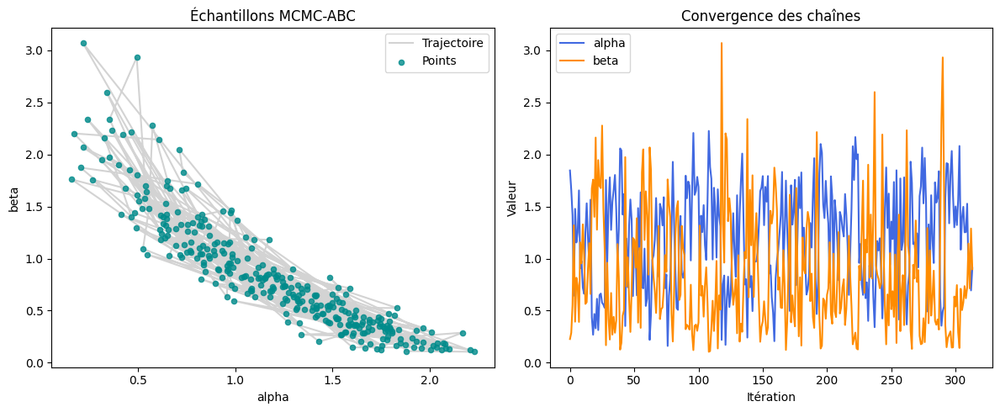

In [90]:

samples = np.array(samples)
alphas = samples[:, 0]
betas = samples[:, 1]


plt.figure(figsize=(12, 5))


plt.subplot(1, 2, 1)
plt.plot(alphas, betas, color='lightgray', linewidth=1.5, label="Trajectoire", zorder=1)
plt.scatter(alphas, betas, alpha=0.8, s=20, color='darkcyan', label="Points", zorder=2)
plt.xlabel("alpha")
plt.ylabel("beta")
plt.title("Échantillons MCMC-ABC")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(alphas, label="alpha", color='royalblue')
plt.plot(betas, label="beta", color='darkorange')
plt.xlabel("Itération")
plt.ylabel("Valeur")
plt.title("Convergence des chaînes")
plt.legend()

plt.tight_layout()
plt.show()


In [91]:
def plot_kde_mcmc_abc(samples, true_alpha=None, true_beta=None, title="2D KDE of MCMC-ABC Samples"):
    if len(samples) == 0:
        print("No samples to plot.")
        return

    samples = np.array(samples)
    alpha_samples = samples[:, 0]
    beta_samples = samples[:, 1]

    # Compute statistics
    alpha_mean = np.mean(alpha_samples)
    beta_mean = np.mean(beta_samples)
    alpha_std = np.std(alpha_samples)
    beta_std = np.std(beta_samples)

    # Print numerical values
    print(f"True alpha: {true_alpha}")
    print(f"Estimated alpha: {alpha_mean:.4f} ± {alpha_std:.4f}")
    print(f"True beta: {true_beta}")
    print(f"Estimated beta: {beta_mean:.4f} ± {beta_std:.4f}")

    # Plot KDE
    plt.figure(figsize=(8, 6))
    kde = sns.kdeplot(x=alpha_samples, y=beta_samples, fill=True, cmap="mako", thresh=0.05)

    # Add colorbar
    mappable = kde.collections[0]
    plt.colorbar(mappable, label="Density")

    # Plot mean with error bars
    plt.errorbar(alpha_mean, beta_mean, xerr=alpha_std, yerr=beta_std, fmt='o', color='red', label='Mean ± Std')

    # Plot true values
    if true_alpha is not None and true_beta is not None:
        plt.scatter(true_alpha, true_beta, color='blue', s=100, edgecolor='black', marker='X', label='True (α, β)')

    plt.title(title)
    plt.xlabel("Alpha")
    plt.ylabel("Beta")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


True alpha: 1.0
Estimated alpha: 1.1967 ± 0.4740
True beta: 0.9
Estimated beta: 0.8469 ± 0.5529


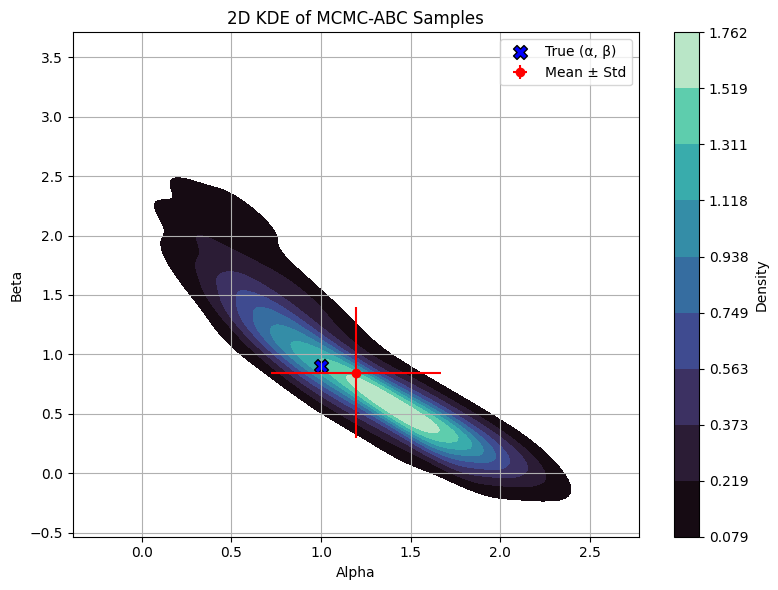

In [92]:
plot_kde_mcmc_abc(samples, true_alpha=1., true_beta=0.9, title="2D KDE of MCMC-ABC Samples")


We have a lot more value of $(\alpha,\beta)$ accepted but the prediction is note as good as before. Moreover there is also some issue with this algorithm because this works well for random variable such that the value accepted is convex (or at least connex by arc) because in the other case if we begin at the wrong initial parameter then it is not possible to each the true parameter.

We can now try to reach the 1% treshold to obtain better inference.

In [93]:
theta0 = [1.0, 0.9]

# Génère une liste de trajectoires simulées comme "observées"
# ystar_array = Gibbs_P(X0, 1.0, 0.9, n, d, eps, max_iter, plot=0)[0]
# ystar = list(ystar_array)  # conversion importante ici !

samples = mcmc_abc_gaussian_kernel(
    ystar=ystar,
    theta0=theta0,
    proposal_sampler=proposal_sampler,
    proposal_density=proposal_density,
    prior_density=prior_density,
    n_iter=10000,
    n=n,
    d=d,
    eps=0.01,
    eps2=0.01,
    max_iter=max_iter,
    sigma = 1
)

print('There was '+str(len(samples))+' values accepted')

MCMC-ABC: 100%|██████████| 10000/10000 [00:17<00:00, 560.86it/s]

There was 23 values accepted


True alpha: 1.0
Estimated alpha: 1.1682 ± 0.5327
True beta: 0.9
Estimated beta: 0.8304 ± 0.5374


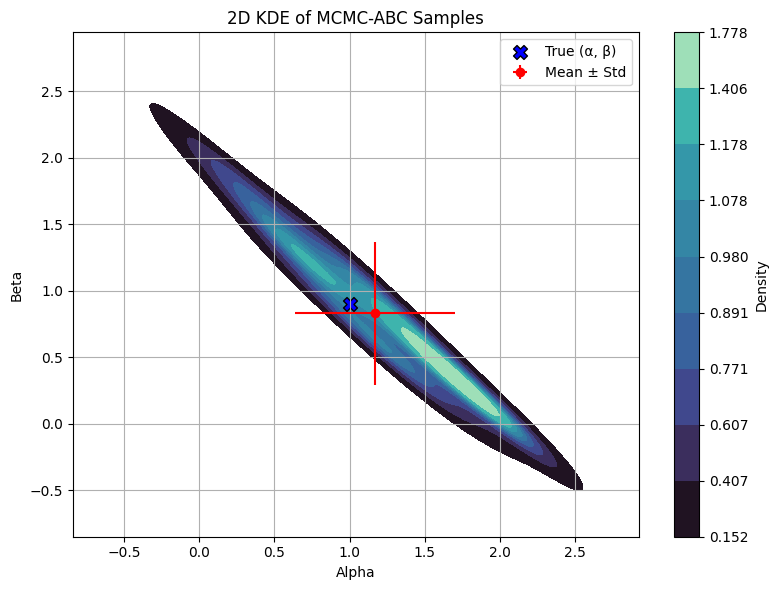

In [94]:
plot_kde_mcmc_abc(samples, true_alpha=1., true_beta=0.9, title="2D KDE of MCMC-ABC Samples")


Even with the 1% acceptance rate, with the MCMC-ABC the true value is not as close to the mean as with the ABC algorithm. Then this algorithm is note as usefull as ABC for inference on a spin chain unless there is a very large number of spins (which is usually the case in physics)

### b) The 2D closed grid

In [95]:
# Simuler UNE SEULE FOIS les données observées avec les vrais paramètres vrais
alpha_true = 0.8
beta_true = 1.2
N = 20
iterations_simulation = 50
X_obs = gibbs_sampler_ising_periodique_fast(alpha_true, beta_true, N, iterations_simulation)

In [96]:
def init_abc_mcmc(X_obs, alpha_prior, beta_prior, N, gibbs_iter, epsilon):
    """
    Initializes the ABC-MCMC algorithm by finding an (alpha, beta) pair
    that is acceptable using a simple ABC-Rejection method (i.e., distance <= epsilon).
    """
    S_obs = sufficient_statistic(X_obs)  # Compute observed summary statistic

    while True:
        # Sample alpha and beta from the prior distributions
        alpha = np.random.uniform(*alpha_prior)
        beta = np.random.uniform(*beta_prior)

        # Simulate data using the candidate parameters
        X_sim = gibbs_sampler_ising_periodique_fast(alpha, beta, N, gibbs_iter)
        S_sim = sufficient_statistic(X_sim)  # Compute summary of simulated data

        # Compute the distance between simulated and observed summaries
        distance = np.linalg.norm(S_sim - S_obs)

        # Accept the parameters if the distance is below epsilon
        if distance <= epsilon:
            print(f"Initialization successful with alpha = {alpha:.3f}, beta = {beta:.3f} (distance = {distance:.2f})")
            return [alpha, beta]


In [97]:
def ABC_MCMC(X_obs, theta0, alpha_prior, beta_prior, N, gibbs_iter, epsilon, n_iter, proposal_sd):
    """
    Implementation of the ABC-MCMC algorithm (Algorithm 3).

    Parameters:
        - X_obs : observed data (Ising model)
        - theta0 : initial tuple (alpha0, beta0)
        - alpha_prior, beta_prior : prior intervals as tuples (uniform prior)
        - N : size of the grid
        - gibbs_iter : number of Gibbs sampling iterations
        - epsilon : ABC tolerance threshold
        - n_iter : number of MCMC iterations
        - proposal_sd : standard deviation of the Gaussian proposal
    """
    S_obs = sufficient_statistic(X_obs)  # Compute summary of the observed data
    theta_chain = [theta0]  # Initialize the MCMC chain with starting values

    for t in range(1, n_iter):
        alpha_curr, beta_curr = theta_chain[-1]

        # Propose new candidate parameters using a Gaussian random walk
        alpha_prop = np.random.normal(alpha_curr, proposal_sd)
        beta_prop = np.random.normal(beta_curr, proposal_sd)

        # Ensure the proposal is within prior support
        if not (alpha_prior[0] <= alpha_prop <= alpha_prior[1] and beta_prior[0] <= beta_prop <= beta_prior[1]):
            theta_chain.append((alpha_curr, beta_curr))
            continue

        # Simulate data with the proposed parameters
        X_sim = gibbs_sampler_ising_periodique_fast(alpha_prop, beta_prop, N, gibbs_iter)
        S_sim = sufficient_statistic(X_sim)
        distance = np.linalg.norm(S_sim - S_obs)

        # ABC criterion: accept if distance is small enough
        if distance <= epsilon:
            # Uniform prior and symmetric proposal → ratio = 1
            theta_chain.append((alpha_prop, beta_prop))

    return np.array(theta_chain)


Example

In [98]:
alpha_prior=(-1, 2)
beta_prior=(0, 2)
gibbs_iter=50
epsilon=0.5
n_iter=10000
proposal_sd=1  # To be adjust
theta0 = init_abc_mcmc(X_obs, alpha_prior, beta_prior, N, gibbs_iter, epsilon)


Initialization successful with alpha = 1.481, beta = 0.743 (distance = 0.00)


In [99]:
def plot_abc_mcmc_results(theta_chain, alpha_true=None, beta_true=None):
    """
    Plot a 2D KDE with colorbar, mean and standard deviation error bars
    for the output of the ABC-MCMC algorithm.
    
    Parameters:
        - theta_chain: array of shape (n_iter, 2), ABC-MCMC samples of (alpha, beta)
        - alpha_true: true alpha value (optional)
        - beta_true: true beta value (optional)
    """
    alpha_samples = theta_chain[:, 0]
    beta_samples = theta_chain[:, 1]

    # Compute statistics
    alpha_mean = np.mean(alpha_samples)
    beta_mean = np.mean(beta_samples)
    alpha_std = np.std(alpha_samples)
    beta_std = np.std(beta_samples)

    # Print numerical values
    print(f"Mean alpha: {alpha_mean:.4f} ± {alpha_std:.4f}")
    print(f"Mean beta : {beta_mean:.4f} ± {beta_std:.4f}")
    if alpha_true is not None and beta_true is not None:
        print(f"True alpha: {alpha_true}, True beta: {beta_true}")
    print('There was '+str(len(theta_chain))+' parameters accepted')
    
    # Plotting
    plt.figure(figsize=(8, 6))
    kde = sns.kdeplot(
        x=alpha_samples,
        y=beta_samples,
        fill=True,
        cmap="viridis",
        thresh=0.05,
        levels=100
    )

    # Add colorbar
    mappable = kde.collections[0]
    plt.colorbar(mappable, label="Density")

    # Mean point with error bars
    plt.errorbar(alpha_mean, beta_mean, xerr=alpha_std, yerr=beta_std,
                 fmt='o', color='red', label="Mean ± Std")

    # True value marker
    if alpha_true is not None and beta_true is not None:
        plt.scatter(alpha_true, beta_true, color='blue', s=100, edgecolor='black', label="True values", marker='X')

    # Styling
    plt.xlabel("Alpha")
    plt.ylabel("Beta")
    plt.title("2D KDE of (α, β) from ABC-MCMC")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


Mean alpha: 1.1060 ± 0.5544
Mean beta : 0.9671 ± 0.2156
True alpha: 0.8, True beta: 1.2
There was 4955 parameters accepted


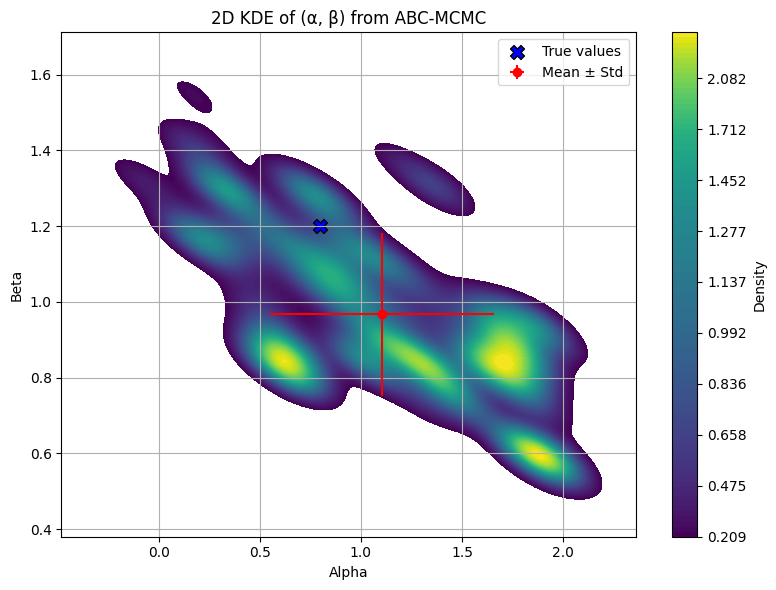

In [100]:
theta_chain = ABC_MCMC(X_obs, theta0, alpha_prior, beta_prior, N, gibbs_iter, epsilon, n_iter, proposal_sd)
plot_abc_mcmc_results(theta_chain, alpha_true= alpha_true, beta_true= beta_true)


There is a huge increase of parameters accepted but we clearly cannot estimate $(\alpha,\beta)$ with mean with respect to the posterior distribution. Thus is is not better than the ABC algorithm for the Ising distribution in 1D and 2D.

## Conclusion

To conclude, the Ising distribution is a very interesting model both theoretically and experimentally. The large interest for this model come from his simplicity and, as we have seen during this work, it is really easy to simulate it with a classic Gibbs sampler. Despite its simplicity, the main issue with the model is the normalisation factor because of the number of terms that grows exponentially with the size of the system, leading to the impossibility to estimate $(\alpha,\beta)$ with a Maximum of Likelihood Estimator. This is why we worked on two main algorithm to estimate these parameters, the ABC and the MCMC-ABC. These two algorithm are very interesting for there property of converging to the real distribution when $\varepsilon \to 0$, but the one that did the best inference of the two is the ABC that estimates perfectly the parameters of the spin chain (by taking the mean with respect to the posterior distribution) and estimates quite well the parameters for the 2D grid. The main benefit of the MCMC-ABC is its huge acceptance rate compared to the ABC for a same value of $\varepsilon$, leading to some possible applications, but not usefull in this work.

## Apendix

In this part, we show some results about models that we briefly studied to obtained better inference with ABC for the 2D grid

The first algorithm used a similar idea as the ABC algorithm but instead of fixing a threshold with respect to the difference the sufficient statistic for the simulated data and the true date, the threshold is in the form of a percentage of the sampled data that is rejected.

In [101]:
def ABC_reject_quantile(X_obs, alpha_prior, beta_prior, N, n_iter, gibbs_iter, quantile=0.01):
    distances = []
    params = []
    S_obs = sufficient_statistic(X_obs)

    for _ in range(n_iter):
        alpha_star = np.random.uniform(*alpha_prior)
        beta_star = np.random.uniform(*beta_prior)
        X_sim = gibbs_sampler_ising_periodique_fast(alpha_star, beta_star, N, gibbs_iter)
        S_sim = sufficient_statistic(X_sim)
        distance = np.linalg.norm(S_sim - S_obs)

        distances.append(distance)
        params.append((alpha_star, beta_star))

    distances = np.array(distances)
    params = np.array(params)

    threshold = np.quantile(distances, quantile)
    accepted_params = params[distances <= threshold]

    print(f"{len(accepted_params)} paramètres acceptés ({quantile*100:.1f}% des simulations)")
    print(f"Seuil ε automatique = {threshold:.4f}")

    return accepted_params, threshold

In [102]:
accepted_params, epsilon_auto = ABC_reject_quantile(
    X_obs, alpha_prior=(-1, 2), beta_prior=(0, 2),
    N=N, n_iter=10000, gibbs_iter=50, quantile=0.1
)

fig = make_subplots(rows=1, cols=2, subplot_titles=[
    f"α (ε ≈ {epsilon_auto:.2f})", f"β (ε ≈ {epsilon_auto:.2f})"
])

fig.add_trace(go.Histogram(
    x=accepted_params[:, 0], nbinsx=30,
    marker=dict(color='rgba(135, 206, 250, 0.8)'),
    name='α'
), row=1, col=1)

fig.add_trace(go.Histogram(
    x=accepted_params[:, 1], nbinsx=30,
    marker=dict(color='rgba(144, 238, 144, 0.8)'),
    name='β'
), row=1, col=2)

fig.add_vline(x=alpha_true, line_dash="dash", line_color="red", row=1, col=1)
fig.add_vline(x=beta_true, line_dash="dash", line_color="red", row=1, col=2)

fig.update_layout(
    title_text="ABC Rejection avec ε adaptatif (quantile)",
    showlegend=False,
    height=500,
    width=1000,
    plot_bgcolor='rgba(245,245,245,1)',
    paper_bgcolor='white'
)

fig.update_xaxes(title_text="α", row=1, col=1)
fig.update_xaxes(title_text="β", row=1, col=2)
fig.update_yaxes(title_text="Fréquence", row=1, col=1)
fig.update_yaxes(title_text="Fréquence", row=1, col=2)

fig.show()

1553 paramètres acceptés (10.0% des simulations)
Seuil ε automatique = 8.2462


The second methods use a quantile ABC first to choose the data and then give more importance to the data if it is closer to the real data (this example use an gaussian function for the importance function)

In [103]:
def ABC_reject_weighted(X_obs, alpha_prior, beta_prior, N, n_iter, gibbs_iter, quantile=0.05):
    distances = []
    params = []
    S_obs = sufficient_statistic(X_obs)

    for _ in range(n_iter):
        # Sample from the prior distributions
        alpha_star = np.random.uniform(*alpha_prior)
        beta_star = np.random.uniform(*beta_prior)

        # Simulate data using the candidate parameters
        X_sim = gibbs_sampler_ising_periodique_fast(alpha_star, beta_star, N, gibbs_iter)

        # Compute the summary statistic and distance
        S_sim = sufficient_statistic(X_sim)
        distance = np.linalg.norm(S_sim - S_obs)

        distances.append(distance)
        params.append((alpha_star, beta_star))

    distances = np.array(distances)
    params = np.array(params)

    # Compute the distance threshold from the quantile
    threshold = np.quantile(distances, quantile)

    # Select accepted parameters based on threshold
    mask = distances <= threshold
    accepted_params = params[mask]
    accepted_distances = distances[mask]

    # Apply Gaussian weighting to accepted parameters
    weights = np.exp(- (accepted_distances**2) / (2 * threshold**2))
    weights /= np.sum(weights)  # Normalize the weights

    print(f"{len(accepted_params)} parameters accepted (quantile {quantile}, ε ≈ {threshold:.3f})")

    return accepted_params, weights, threshold


In [104]:
# Appel de la méthode pondérée
accepted_params, weights, epsilon_auto = ABC_reject_weighted(
    X_obs, alpha_prior=(-1, 2), beta_prior=(0, 2),
    N=N, n_iter=10000, gibbs_iter=50,
    quantile=0.05
)

alpha_vals = accepted_params[:, 0]
beta_vals = accepted_params[:, 1]

# Moyennes pondérées
alpha_mean = np.average(alpha_vals, weights=weights)
beta_mean = np.average(beta_vals, weights=weights)

# Grille pour la densité
alpha_grid = np.linspace(np.min(alpha_vals), np.max(alpha_vals), 200)
beta_grid = np.linspace(np.min(beta_vals), np.max(beta_vals), 200)

# Densité KDE pondérée
kde_alpha = gaussian_kde(alpha_vals, weights=weights)
kde_beta = gaussian_kde(beta_vals, weights=weights)
alpha_density = kde_alpha(alpha_grid)
beta_density = kde_beta(beta_grid)

# Affichage
fig = make_subplots(rows=1, cols=2, subplot_titles=[
    f"α (ε ≈ {epsilon_auto:.2f})", f"β (ε ≈ {epsilon_auto:.2f})"
])

# Histogramme pondéré α
fig.add_trace(go.Histogram(
    x=alpha_vals, histnorm='probability', name="α",
    marker=dict(color='rgba(135, 206, 250, 0.6)'),
    opacity=0.8, nbinsx=30, xbins=dict(start=-1, end=2),
    autobinx=False, customdata=weights,
    hovertemplate="α: %{x:.2f}<br>Poids: %{customdata:.4f}<extra></extra>"
), row=1, col=1)

# KDE α
fig.add_trace(go.Scatter(
    x=alpha_grid, y=alpha_density, mode='lines', name='Densité α',
    line=dict(width=2)
), row=1, col=1)

# Histogramme pondéré β
fig.add_trace(go.Histogram(
    x=beta_vals, histnorm='probability', name="β",
    marker=dict(color='rgba(144, 238, 144, 0.6)'),
    opacity=0.8, nbinsx=30, xbins=dict(start=0, end=2),
    autobinx=False, customdata=weights,
    hovertemplate="β: %{x:.2f}<br>Poids: %{customdata:.4f}<extra></extra>"
), row=1, col=2)

# KDE β
fig.add_trace(go.Scatter(
    x=beta_grid, y=beta_density, mode='lines', name='Densité β',
    line=dict(width=2)
), row=1, col=2)

# Lignes verticales
fig.add_vline(x=alpha_true, line_color="red", line_dash="dash", row=1, col=1)
fig.add_vline(x=beta_true, line_color="red", line_dash="dash", row=1, col=2)

fig.add_vline(x=alpha_mean, line_color="blue", line_dash="dot", row=1, col=1)
fig.add_vline(x=beta_mean, line_color="blue", line_dash="dot", row=1, col=2)

# Layout
fig.update_layout(
    title_text="ABC avec pondération par distance : Histogrammes & Densités pondérées",
    width=1000, height=500, showlegend=False,
    plot_bgcolor='rgba(245,245,245,1)',
    paper_bgcolor='white',
    margin=dict(l=40, r=40, t=60, b=40)
)

fig.update_xaxes(title_text="α", row=1, col=1)
fig.update_xaxes(title_text="β", row=1, col=2)
fig.update_yaxes(title_text="Densité", row=1, col=1)
fig.update_yaxes(title_text="Densité", row=1, col=2)

fig.show()

640 parameters accepted (quantile 0.05, ε ≈ 4.123)
